# Bioactive Conformation Analysis

* How important is including the stereochemistry? **Not very**
* How do rdkit variants compare to DMCG? **RDKit variants nearly identical with each other, better than DMCG**
* How does initial size of ensemble effect recall? **More always better, but do not need very many conformers**
* How does energy minimization effect recall? **Very slight improvement for RDKit, more important for DMCG**
* If only low energy subsets of a larger ensemble are used, how does this effect recall? **Only single conformer ensembles benefit due to low diversity of ensemble**
* If energy ranked conformers are filtered by RMSD, how does this effect recall?  **Filtering improves recall, but is only (sometimes) marginally better than a random sample.**
* What is the relationship between number of rotatable bonds and recall?  **More flexible result in worse recall; DMCG struggles more with larger molecules**


In [16]:
import glob, sys, os, re, gzip, io, subprocess, multiprocessing
from rdkit.Chem import AllChem as Chem
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from matplotlib import cm
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle
from matplotlib.legend_handler import HandlerLineCollection, HandlerTuple


In [2]:
subset_sizes = [1,5,10,25,50,100,250]

colormaps = {
    'rdkitdg': cm.get_cmap('Greys'),
    'rdkitetkdg': cm.get_cmap('autumn_r'),
    'dmcg': cm.get_cmap('winter_r'),
    'auto3d': cm.get_cmap('Purples')
}

colors = {
    'rdkitdg': {N:colormaps['rdkitdg']((i+25)/(len(subset_sizes)+25)) for i,N in enumerate(subset_sizes)},
    'rdkitetkdg': {N:colormaps['rdkitetkdg'](i/len(subset_sizes)) for i,N in enumerate(subset_sizes)},
    'dmcg': {N:colormaps['dmcg'](i/len(subset_sizes)) for i,N in enumerate(subset_sizes)},
    'auto3d': {N:colormaps['auto3d']((i+2)/(len(subset_sizes)+2)) for i,N in enumerate(subset_sizes)},
}

names = {
    'platinum2017': "Platinum 2017",
    'refined-set': "PDBbind 2020 Refined",
    'rdkitdg': "RDKit DG",
    'rdkitetkdg': "RDKIT ETKDGv3",
    'dmcg': "DMCG",
    'auto3d':"Auto3D"
}

Create massive pandas table aggregated bioactive matching RMSD information.

In [3]:
def process_sdf(sdf):
    try:
        parts = sdf.split('/')
        bench = parts[0]
        name = parts[-1]
        m = re.search(r'(\S+)_(\S+)_250_(?:(\S+)_)?(\S+).sdf.gz',name)
        basedir = os.path.dirname(sdf)

        base = os.path.join(basedir,m.group(1))
        approach = m.group(2)
        if m.group(3):
            approach += m.group(3)

        minimized = m.group(4)
        smi = base+'.smi'

        rmsfile = sdf.replace('.sdf.gz','.rmsds.txt')
        rmsds = pd.read_table(rmsfile,header=None,delim_whitespace=True).iloc[:,-1]

        mol = Chem.MolFromSmiles(open(smi).read())
        nrot = Chem.CalcNumRotatableBonds(mol)
        
        ename = sdf.replace('.sdf.gz','.energy.npy')
        if os.path.exists(ename):
            energies = np.load(ename)
            assert len(energies) == len(rmsds)
        else:
            energies = np.zeros_like(rmsds)
        
        ret = []
        for i,RE in enumerate(zip(rmsds,energies)):
            r,e = RE
            ret.append([bench,name,base,'nosc' in base, nrot, approach, i,minimized,r,e])
            
        
        df = pd.DataFrame(ret,columns=['bench','fname','base','nosc','nrot','approach','pos','minimized','rmsd','energy'])
        df['erank'] = df.energy.rank()
        return df
    except Exception as e:
        print(sdf,e)
        return None

In [4]:

files = glob.glob('platinum2017/*.sdf.gz') + glob.glob('refined-set/*/*.sdf.gz')
with multiprocessing.Pool(50) as pool:
    results = list(tqdm(
        pool.imap_unordered(process_sdf, files,chunksize=10),
        total=len(files)))

 44%|████▍     | 53881/122359 [00:58<01:08, 998.51it/s] 

refined-set/4or6/4or6_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
 refined-set/4or6/4or6_ligand_dmcg_250_min.sdf.gzNo columns to parse from file


 45%|████▍     | 54490/122359 [00:59<01:14, 906.93it/s]

refined-set/4non/4non_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4non/4non_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 45%|████▍     | 54583/122359 [00:59<01:14, 911.58it/s]

refined-set/6g14/6g14_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6g14/6g14_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from file

 45%|████▍     | 54791/122359 [00:59<01:12, 931.46it/s]

refined-set/4e67/4e67_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4e67/4e67_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 45%|████▌     | 55411/122359 [01:00<01:08, 973.31it/s]

refined-set/6mja/6mja_ligand_nosc_dmcg_250_unmin.sdf.gzrefined-set/6mja/6mja_ligand_dmcg_250_min.sdf.gz No columns to parse from file
 No columns to parse from file
refined-set/6mja/6mja_ligand_dmcg_250_unmin.sdf.gz

 45%|████▌     | 55511/122359 [01:00<01:08, 969.35it/s]

 No columns to parse from file
refined-set/6mja/6mja_ligand_nosc_dmcg_250_min.sdf.gz No columns to parse from file


 46%|████▌     | 56341/122359 [01:00<01:06, 999.93it/s]

refined-set/3lzz/3lzz_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/3lzz/3lzz_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 46%|████▋     | 56874/122359 [01:01<01:04, 1014.82it/s]

refined-set/6sge/6sge_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6sge/6sge_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file 


 47%|████▋     | 57173/122359 [01:01<01:09, 937.49it/s] 

refined-set/5gof/5gof_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from filerefined-set/5gof/5gof_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 47%|████▋     | 57881/122359 [01:02<01:05, 982.05it/s]

refined-set/3bbf/3bbf_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/3bbf/3bbf_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 48%|████▊     | 59111/122359 [01:03<01:05, 963.22it/s]

refined-set/6mxc/6mxc_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6mxc/6mxc_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from file

 49%|████▉     | 60481/122359 [01:05<01:01, 1005.89it/s]

refined-set/3evd/3evd_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/3evd/3evd_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 50%|████▉     | 60691/122359 [01:05<01:01, 1003.55it/s]

refined-set/1bzy/1bzy_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file 
refined-set/1bzy/1bzy_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 50%|█████     | 61691/122359 [01:06<01:02, 976.27it/s] 

refined-set/3h8b/3h8b_ligand_dmcg_250_unmin.sdf.gz 
No columns to parse from filerefined-set/3h8b/3h8b_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/3h8b/3h8b_ligand_nosc_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/3h8b/3h8b_ligand_nosc_dmcg_250_unmin.sdf.gz No columns to parse from file


 51%|█████     | 61985/122359 [01:06<01:02, 961.58it/s]

refined-set/5efc/5efc_ligand_dmcg_250_min.sdf.gz No columns to parse from fileNo columns to parse from file
refined-set/5efc/5efc_ligand_dmcg_250_unmin.sdf.gz 


 51%|█████     | 62401/122359 [01:07<01:02, 960.32it/s]

refined-set/3bbb/3bbb_ligand_dmcg_250_min.sdf.gz 
refined-set/3bbb/3bbb_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file No columns to parse from file


 51%|█████     | 62511/122359 [01:07<01:01, 974.39it/s]

refined-set/4nxv/4nxv_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file refined-set/4nxv/4nxv_ligand_dmcg_250_min.sdf.gz
 No columns to parse from file

 51%|█████     | 62609/122359 [01:07<01:01, 973.29it/s]

 51%|█████     | 62707/122359 [01:07<01:02, 955.70it/s]

refined-set/5m04/5m04_ligand_dmcg_250_min.sdf.gz 

 51%|█████▏    | 62803/122359 [01:07<01:03, 944.31it/s]

No columns to parse from file
refined-set/5m04/5m04_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 52%|█████▏    | 63201/122359 [01:08<01:02, 952.88it/s]

refined-set/3fvh/3fvh_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/3fvh/3fvh_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from file

 54%|█████▎    | 65541/122359 [01:11<01:00, 946.84it/s]

refined-set/3ozg/3ozg_ligand_dmcg_250_unmin.sdf.gz 

 54%|█████▎    | 65641/122359 [01:11<00:59, 958.89it/s]

No columns to parse from file
refined-set/3ozg/3ozg_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 56%|█████▌    | 68772/122359 [01:14<00:56, 952.97it/s] 

refined-set/5tef/5tef_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file 

 56%|█████▋    | 68871/122359 [01:14<00:55, 963.53it/s]


refined-set/5tef/5tef_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 57%|█████▋    | 70353/122359 [01:15<00:52, 983.32it/s] 

refined-set/4muv/4muv_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/4muv/4muv_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 59%|█████▉    | 72071/122359 [01:17<00:51, 970.83it/s]

refined-set/5kly/5kly_ligand_dmcg_250_min.sdf.gz No columns to parse from file

 59%|█████▉    | 72181/122359 [01:17<00:50, 992.65it/s]


refined-set/5kly/5kly_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 60%|██████    | 73509/122359 [01:19<00:51, 950.01it/s] 

refined-set/4idn/4idn_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4idn/4idn_ligand_dmcg_250_unmin.sdf.gz

 60%|██████    | 73611/122359 [01:19<00:51, 952.31it/s]

 No columns to parse from file


 60%|██████    | 73811/122359 [01:19<00:51, 950.12it/s]

refined-set/4lhv/4lhv_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4lhv/4lhv_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 60%|██████    | 73911/122359 [01:19<00:51, 949.34it/s]

refined-set/1dqn/1dqn_ligand_dmcg_250_unmin.sdf.gzrefined-set/1dqn/1dqn_ligand_dmcg_250_min.sdf.gz 

 60%|██████    | 74021/122359 [01:19<00:49, 969.82it/s]

No columns to parse from file
 No columns to parse from file


 61%|██████    | 74216/122359 [01:19<00:50, 947.39it/s]

refined-set/4emf/4emf_ligand_dmcg_250_min.sdf.gz  No columns to parse from file
refined-set/4emf/4emf_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file


 62%|██████▏   | 76381/122359 [01:22<00:46, 992.55it/s]

refined-set/5ipc/5ipc_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/5ipc/5ipc_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 63%|██████▎   | 77311/122359 [01:23<00:46, 966.76it/s] 

refined-set/6hgs/6hgs_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6hgs/6hgs_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 63%|██████▎   | 77411/122359 [01:23<00:47, 951.56it/s]

refined-set/5jsq/5jsq_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/5jsq/5jsq_ligand_dmcg_250_min.sdf.gz
No columns to parse from file 

 64%|██████▍   | 78901/122359 [01:24<00:44, 971.94it/s]

refined-set/4rd0/4rd0_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/4rd0/4rd0_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 66%|██████▌   | 80161/122359 [01:26<01:56, 363.50it/s] 

refined-set/4emr/4emr_ligand_dmcg_250_min.sdf.gz 

 66%|██████▌   | 80261/122359 [01:27<01:34, 446.62it/s]


No columns to parse from filerefined-set/4emr/4emr_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from file

 66%|██████▌   | 80661/122359 [01:27<00:55, 750.10it/s]

refined-set/3hv8/3hv8_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/3hv8/3hv8_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 66%|██████▋   | 81071/122359 [01:27<00:44, 930.43it/s]

refined-set/3egt/3egt_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/3egt/3egt_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 67%|██████▋   | 81781/122359 [01:28<00:41, 982.37it/s]

refined-set/6j72/6j72_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6j72/6j72_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 67%|██████▋   | 81881/122359 [01:28<00:41, 982.57it/s]

refined-set/4or4/4or4_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from file

 67%|██████▋   | 81991/122359 [01:28<00:41, 984.34it/s]

refined-set/4or4/4or4_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 68%|██████▊   | 82683/122359 [01:29<00:41, 950.59it/s]

refined-set/2e94/2e94_ligand_dmcg_250_unmin.sdf.gz 

 68%|██████▊   | 82791/122359 [01:29<00:40, 965.10it/s]

No columns to parse from file
refined-set/2e94/2e94_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 68%|██████▊   | 83101/122359 [01:29<00:39, 983.87it/s]

refined-set/4rd6/4rd6_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4rd6/4rd6_ligand_dmcg_250_unmin.sdf.gz 

 68%|██████▊   | 83201/122359 [01:30<00:40, 970.98it/s]

No columns to parse from file


 70%|██████▉   | 85091/122359 [01:32<00:38, 975.77it/s]

refined-set/2rcn/2rcn_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/2rcn/2rcn_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 70%|███████   | 85801/122359 [01:32<00:37, 968.99it/s]

refined-set/4dcs/4dcs_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/4dcs/4dcs_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 70%|███████   | 86201/122359 [01:33<00:37, 965.91it/s]

refined-set/6hq7/6hq7_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6hq7/6hq7_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 71%|███████   | 86401/122359 [01:33<00:37, 960.22it/s]

refined-set/5irr/5irr_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/5irr/5irr_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 71%|███████   | 86501/122359 [01:33<00:37, 945.51it/s]

refined-set/4ido/4ido_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 71%|███████   | 86611/122359 [01:33<00:37, 965.99it/s]

refined-set/4ido/4ido_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/5ymx/5ymx_ligand_dmcg_250_unmin.sdf.gz 
No columns to parse from filerefined-set/5ymx/5ymx_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 71%|███████   | 86811/122359 [01:33<00:37, 956.90it/s]

refined-set/3mi2/3mi2_ligand_dmcg_250_min.sdf.gz
 No columns to parse from filerefined-set/3mi2/3mi2_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from filerefined-set/2r75/2r75_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/2r75/2r75_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 71%|███████   | 87121/122359 [01:34<00:35, 978.87it/s]

refined-set/2wjg/2wjg_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 71%|███████▏  | 87220/122359 [01:34<00:35, 976.78it/s]

refined-set/2wjg/2wjg_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 71%|███████▏  | 87318/122359 [01:34<00:36, 949.95it/s]

refined-set/4kax/4kax_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4kax/4kax_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 72%|███████▏  | 88061/122359 [01:35<00:34, 988.41it/s]

refined-set/4ksy/4ksy_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
 

 72%|███████▏  | 88171/122359 [01:35<00:34, 991.21it/s]

refined-set/4ksy/4ksy_ligand_dmcg_250_min.sdf.gzNo columns to parse from file


 76%|███████▌  | 92901/122359 [01:40<00:30, 980.86it/s] 

refined-set/2x96/2x96_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/2x96/2x96_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 77%|███████▋  | 93921/122359 [01:41<00:29, 958.60it/s]

refined-set/5k1d/5k1d_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/5k1d/5k1d_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 77%|███████▋  | 94431/122359 [01:41<00:28, 988.44it/s]

refined-set/6g0z/6g0z_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/6g0z/6g0z_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 77%|███████▋  | 94531/122359 [01:41<00:28, 960.98it/s]

refined-set/1wuq/1wuq_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/1wuq/1wuq_ligand_dmcg_250_unmin.sdf.gz
 

 77%|███████▋  | 94631/122359 [01:41<00:28, 960.12it/s]

No columns to parse from file

 78%|███████▊  | 95561/122359 [01:42<00:27, 985.39it/s]

refined-set/6d9s/6d9s_ligand_dmcg_250_min.sdf.gz No columns to parse from file

 78%|███████▊  | 95661/122359 [01:42<00:27, 978.25it/s]


refined-set/6d9s/6d9s_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 78%|███████▊  | 95761/122359 [01:43<00:27, 958.48it/s]

refined-set/4ncn/4ncn_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/4ncn/4ncn_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6czf/6czf_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6czf/6czf_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 78%|███████▊  | 95857/122359 [01:43<00:28, 944.97it/s]

refined-set/4g0z/4g0z_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4g0z/4g0z_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 81%|████████  | 99011/122359 [01:46<00:23, 992.60it/s]

refined-set/4loi/4loi_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4loi/4loi_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 81%|████████▏ | 99531/122359 [01:46<00:23, 981.61it/s]

refined-set/4qrh/4qrh_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/4qrh/4qrh_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 83%|████████▎ | 101041/122359 [01:49<00:27, 778.83it/s]

refined-set/4loh/4loh_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4loh/4loh_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/6jfk/6jfk_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/6jfk/6jfk_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 83%|████████▎ | 101331/122359 [01:49<00:24, 875.18it/s]

refined-set/3h89/3h89_ligand_dmcg_250_unmin.sdf.gz
 No columns to parse from filerefined-set/3h89/3h89_ligand_dmcg_250_min.sdf.gzrefined-set/3h89/3h89_ligand_nosc_dmcg_250_min.sdf.gz No columns to parse from file
 No columns to parse from file

 83%|████████▎ | 101431/122359 [01:49<00:23, 895.44it/s]


refined-set/3h89/3h89_ligand_nosc_dmcg_250_unmin.sdf.gz No columns to parse from file


 84%|████████▍ | 102641/122359 [01:51<00:20, 975.28it/s]

refined-set/3fuc/3fuc_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/3fuc/3fuc_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 87%|████████▋ | 106195/122359 [01:54<00:17, 923.61it/s]

refined-set/4g0q/4g0q_ligand_dmcg_250_min.sdf.gz

 87%|████████▋ | 106288/122359 [01:55<00:17, 923.58it/s]

 No columns to parse from file
refined-set/4g0q/4g0q_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 87%|████████▋ | 106473/122359 [01:55<00:17, 903.98it/s]

refined-set/3q7q/3q7q_ligand_dmcg_250_unmin.sdf.gz 

 87%|████████▋ | 106571/122359 [01:55<00:17, 923.59it/s]

No columns to parse from file
refined-set/3q7q/3q7q_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 88%|████████▊ | 107241/122359 [01:56<00:16, 911.88it/s]

refined-set/5efa/5efa_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/5efa/5efa_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/5kma/5kma_ligand_dmcg_250_min.sdf.gzrefined-set/4rd3/4rd3_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file No columns to parse from file

refined-set/4rd3/4rd3_ligand_dmcg_250_min.sdf.gzrefined-set/5kma/5kma_ligand_dmcg_250_unmin.sdf.gz

 88%|████████▊ | 107341/122359 [01:56<00:16, 916.90it/s]

  No columns to parse from fileNo columns to parse from file



 91%|█████████ | 110981/122359 [01:59<00:11, 965.37it/s]

refined-set/3hit/3hit_ligand_dmcg_250_min.sdf.gz 


 91%|█████████ | 111081/122359 [01:59<00:11, 970.01it/s]

No columns to parse from filerefined-set/3hit/3hit_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 92%|█████████▏| 111991/122359 [02:00<00:11, 920.04it/s]

refined-set/1gvw/1gvw_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file 
refined-set/1gvw/1gvw_ligand_dmcg_250_min.sdf.gzNo columns to parse from file


 92%|█████████▏| 112511/122359 [02:01<00:10, 970.11it/s]

refined-set/4jyb/4jyb_ligand_dmcg_250_min.sdf.gz No columns to parse from file

 92%|█████████▏| 112611/122359 [02:01<00:10, 964.06it/s]


refined-set/4jyb/4jyb_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 92%|█████████▏| 112805/122359 [02:01<00:10, 954.76it/s]

refined-set/4q46/4q46_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/4q46/4q46_ligand_dmcg_250_unmin.sdf.gz
 

 92%|█████████▏| 112901/122359 [02:01<00:10, 934.44it/s]

No columns to parse from file

 93%|█████████▎| 113211/122359 [02:02<00:09, 958.86it/s]

refined-set/3djx/3djx_ligand_dmcg_250_min.sdf.gz 
No columns to parse from filerefined-set/3djx/3djx_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 93%|█████████▎| 113531/122359 [02:02<00:09, 973.23it/s]

refined-set/5ey0/5ey0_ligand_dmcg_250_unmin.sdf.gz 
 No columns to parse from filerefined-set/5ey0/5ey0_ligand_dmcg_250_min.sdf.gzNo columns to parse from file


 94%|█████████▎| 114572/122359 [02:03<00:08, 969.52it/s] 

refined-set/2oc2/2oc2_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 94%|█████████▎| 114671/122359 [02:03<00:08, 959.09it/s]

refined-set/2oc2/2oc2_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 94%|█████████▍| 115179/122359 [02:04<00:07, 920.22it/s]

refined-set/6mji/6mji_ligand_dmcg_250_min.sdf.gz No columns to parse from file
refined-set/6mji/6mji_ligand_nosc_dmcg_250_unmin.sdf.gz refined-set/6mji/6mji_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file 
No columns to parse from file
refined-set/6mji/6mji_ligand_nosc_dmcg_250_min.sdf.gz No columns to parse from file


 94%|█████████▍| 115272/122359 [02:04<00:07, 896.90it/s]

refined-set/1wur/1wur_ligand_dmcg_250_min.sdf.gz No columns to parse from file

refined-set/1wur/1wur_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file

 96%|█████████▌| 117511/122359 [02:06<00:04, 976.99it/s]

refined-set/1tlp/1tlp_ligand_dmcg_250_unmin.sdf.gzNo columns to parse from file 
refined-set/1tlp/1tlp_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 97%|█████████▋| 118718/122359 [02:07<00:03, 966.18it/s]

refined-set/5o58/5o58_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 97%|█████████▋| 118815/122359 [02:08<00:03, 948.24it/s]

refined-set/5o58/5o58_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file


 98%|█████████▊| 119431/122359 [02:08<00:03, 967.27it/s]

refined-set/5bv3/5bv3_ligand_dmcg_250_min.sdf.gz 

 98%|█████████▊| 119531/122359 [02:08<00:02, 953.04it/s]

refined-set/5bv3/5bv3_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
No columns to parse from file


 98%|█████████▊| 119931/122359 [02:09<00:02, 958.85it/s]

refined-set/4lps/4lps_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file

 98%|█████████▊| 120031/122359 [02:09<00:02, 943.83it/s]


refined-set/4lps/4lps_ligand_dmcg_250_min.sdf.gz No columns to parse from file


 98%|█████████▊| 120131/122359 [02:09<00:02, 936.88it/s]

refined-set/4jyc/4jyc_ligand_dmcg_250_unmin.sdf.gz No columns to parse from file
refined-set/4jyc/4jyc_ligand_dmcg_250_min.sdf.gz 

 98%|█████████▊| 120231/122359 [02:09<00:02, 928.03it/s]

No columns to parse from file


100%|██████████| 122359/122359 [02:11<00:00, 930.19it/s] 


In [5]:
D = pd.concat(results)

Exclude any individual targets that do not have at least one conformation generated for all approaches.

In [6]:
cnts = D[D.pos == 0].groupby('base').count()['bench']
methodcnt = len(D.drop_duplicates(['approach','minimized']))
bad = set(cnts[cnts != methodcnt].index)

In [7]:
len(bad)

14497

In [15]:
D.groupby(['bench','fname','base','nosc','approach']).max()['pos'].mean()

248.50743513485796

In [8]:
Dwa3d = D[~D.base.isin(bad)]

In [9]:
Dwa3d[Dwa3d.approach == 'auto3d']

,bench,fname,base,nosc,nrot,approach,pos,minimized,rmsd,energy,erank
0,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,0,min,2.02643,0.0,88.5
1,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,1,min,1.96885,0.0,88.5
2,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,2,min,1.96883,0.0,88.5
3,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,3,min,1.98034,0.0,88.5
4,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,4,min,1.76856,0.0,88.5
...,...,...,...,...,...,...,...,...,...,...,...
234,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,234,min,3.75487,0.0,120.0
235,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,235,min,3.74450,0.0,120.0
236,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,236,min,3.71489,0.0,120.0
237,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,237,min,4.12667,0.0,120.0


In [10]:
D = D[D.approach != 'auto3d']
cnts = D[D.pos == 0].groupby('base').count()['bench']
methodcnt = len(D.drop_duplicates(['approach','minimized']))
bad = set(cnts[cnts != methodcnt].index)
len(bad)

4

In [11]:
D = D[~D.base.isin(bad)]

In [12]:
single_refined = D[(D.bench=='refined-set') & (D.nosc == False) & (D.approach == 'rdkitdg') & (D.pos == 0) & (D.minimized == 'min')]
single_platinum = D[(D.bench=='platinum2017') & (D.nosc == False) & (D.approach == 'rdkitdg') & (D.pos == 0) & (D.minimized == 'min')]

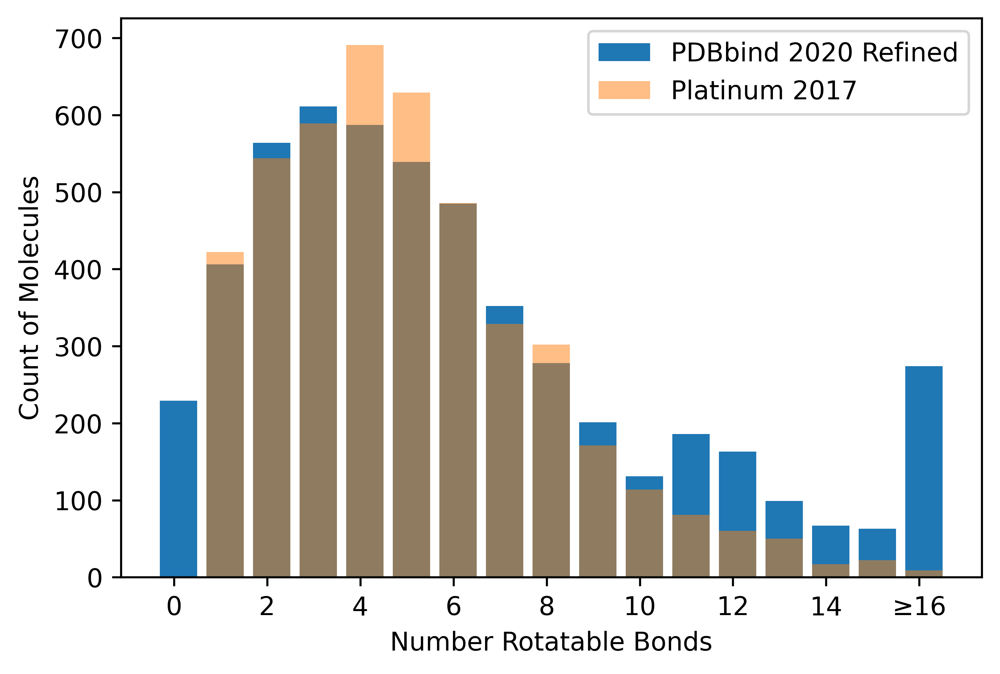

In [13]:
bins = np.linspace(0,17,18)
plt.figure(figsize=(6,4),dpi=600)

plt.hist(np.clip(single_refined.nrot,0,16),bins=bins,rwidth=0.8,label=names['refined-set'])
plt.hist(np.clip(single_platinum.nrot,0,16),bins=bins,alpha=.5,rwidth=0.8,label=names['platinum2017'])
plt.xticks(ticks=np.linspace(0.4,16.4,9),labels=[0,2,4,6,8,10,12,14,"≥16"])
plt.ylabel('Count of Molecules')
plt.xlabel('Number Rotatable Bonds');
plt.legend();
plt.xticks()
plt.savefig('nrothist.pdf',bbox_inches='tight')

In [14]:
len(single_platinum),len(single_refined)

(4516, 5235)

Compare RDKit DG and ETKDG

In [17]:
D[(D.approach != 'dmcg') & (D.pos == 0) & (D.base == ('refined-set/4iuo/4iuo_ligand'))]

,bench,fname,base,nosc,nrot,approach,pos,minimized,rmsd,energy,erank
0,refined-set,4iuo_ligand_rdkit_250_etkdg_min.sdf.gz,refined-set/4iuo/4iuo_ligand,False,1,rdkitetkdg,0,min,0.294763,23.404238,115.0
0,refined-set,4iuo_ligand_rdkit_250_dg_min.sdf.gz,refined-set/4iuo/4iuo_ligand,False,1,rdkitdg,0,min,0.294763,23.404238,115.0
0,refined-set,4iuo_ligand_rdkit_250_etkdg_unmin.sdf.gz,refined-set/4iuo/4iuo_ligand,False,1,rdkitetkdg,0,unmin,0.348962,0.000000,125.5
0,refined-set,4iuo_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/4iuo/4iuo_ligand,False,1,rdkitdg,0,unmin,0.348962,0.000000,125.5


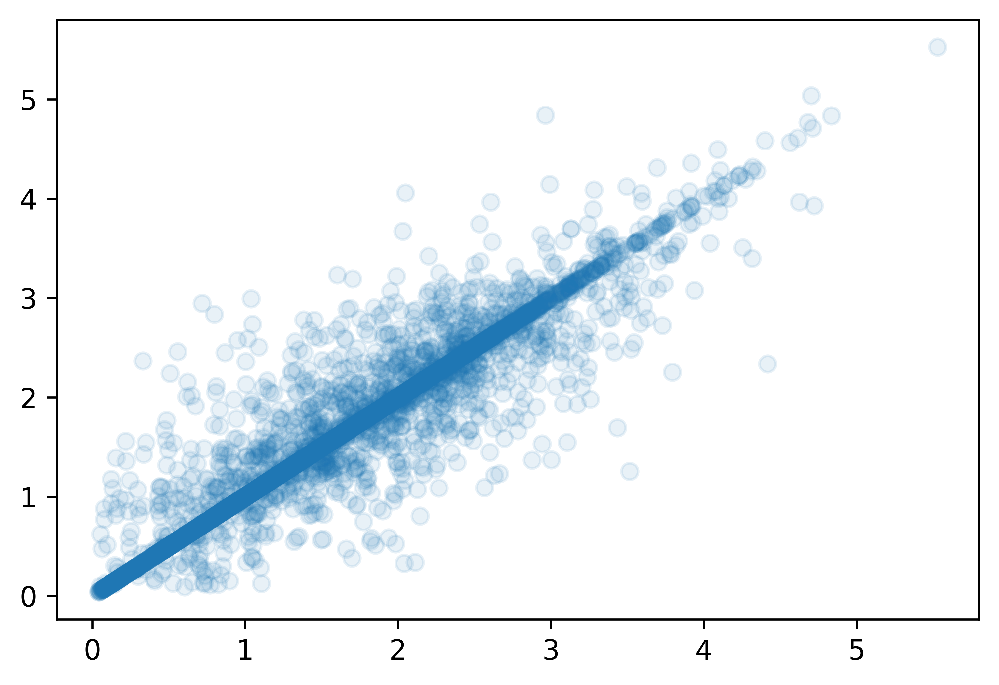

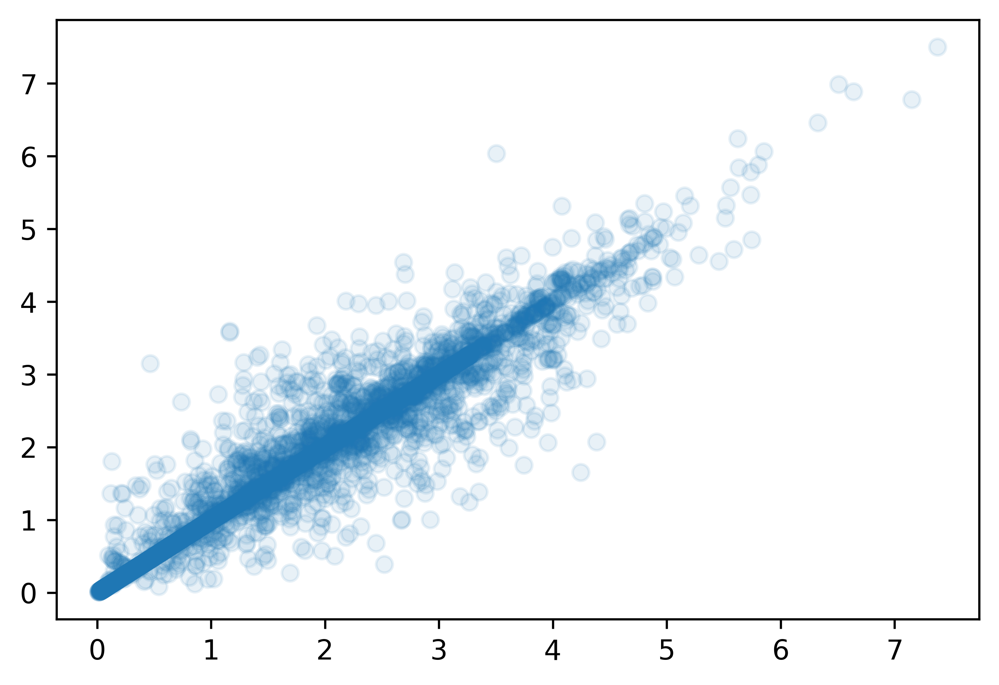

In [18]:
for b in ['platinum2017','refined-set']:
    plt.figure(figsize=(6,4),dpi=600)
    
    bench = D[(D.bench == b) & (D.nosc == False) & (D.minimized == 'min') & (D.pos == 0)]
    df = bench.groupby(['approach','base','fname'])[['rmsd']].min().reset_index()            
    plt.scatter(df[df.approach == 'rdkitdg'].rmsd,df[df.approach == 'rdkitetkdg'].rmsd,alpha=0.1)
    plt.savefig(f'rdscatter_{b}.pdf',bbox_inches='tight')

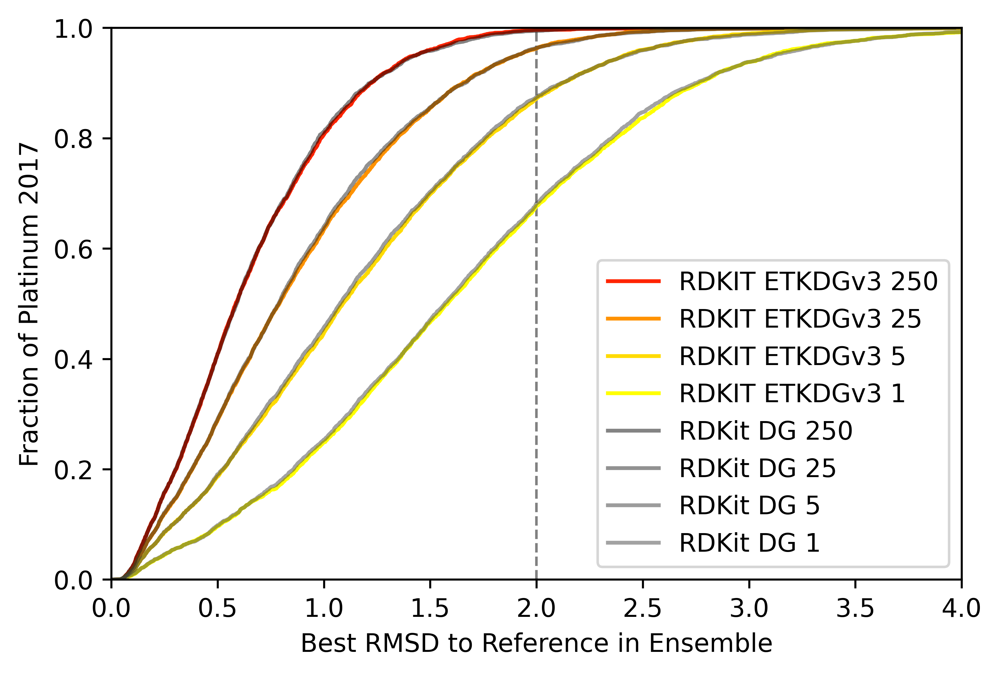

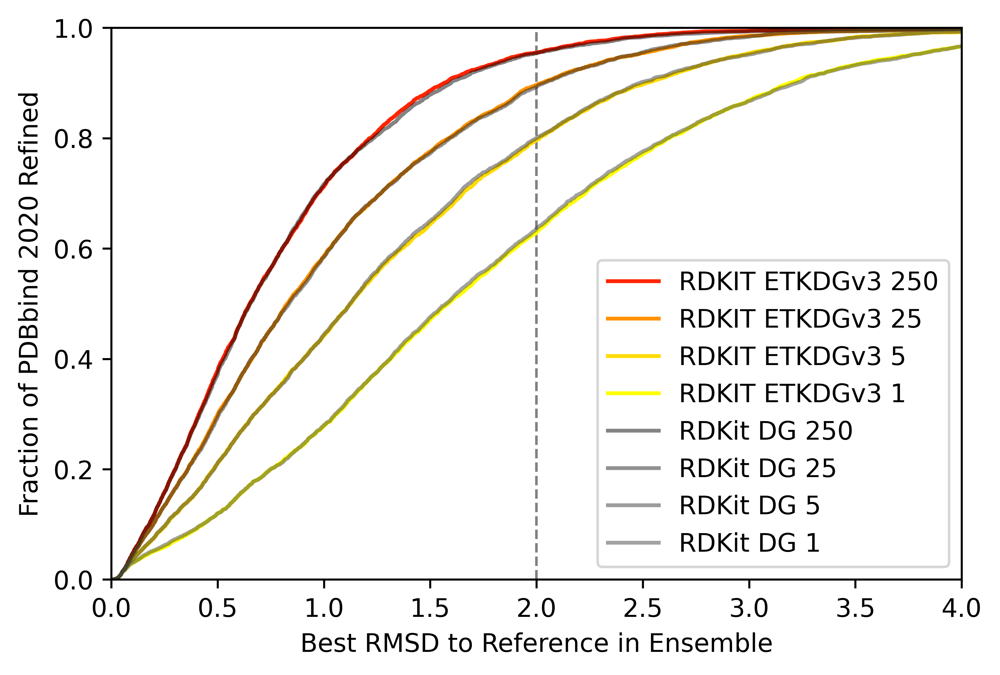

In [39]:
        
for b in ['platinum2017','refined-set']:
    plt.figure(figsize=(6,4),dpi=600)
    plt.axvline(2,color='gray',linestyle='--',linewidth=1)    
    bench = D[(D.bench == b) & (D.nosc == False)] 
    for a in ['rdkitetkdg','rdkitdg']:
        for N in [250,25,5,1]:
                df = bench[(bench.minimized=='min') & (bench.approach == a) & (bench.pos < N)]
                df = df.groupby(['approach','base','fname'])[['rmsd']].min().reset_index()            
                r = df.sort_values(by='rmsd').rmsd
                r = np.array(r)
                plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),
                         alpha = 1.0 if a == 'rdkitetkdg' else 0.5,
                         label=f'{names[a]} {N}', color=colors[a][N])
                

    plt.xlim(0,4)
    plt.ylim(0,1)
    plt.xlabel('Best RMSD to Reference in Ensemble')
    plt.ylabel(f'Fraction of {names[b]}')
    plt.legend();
    plt.savefig(f'rdcomp_{b}.pdf',bbox_inches='tight')

Evaluate with and without stereochemistry on full ensemble

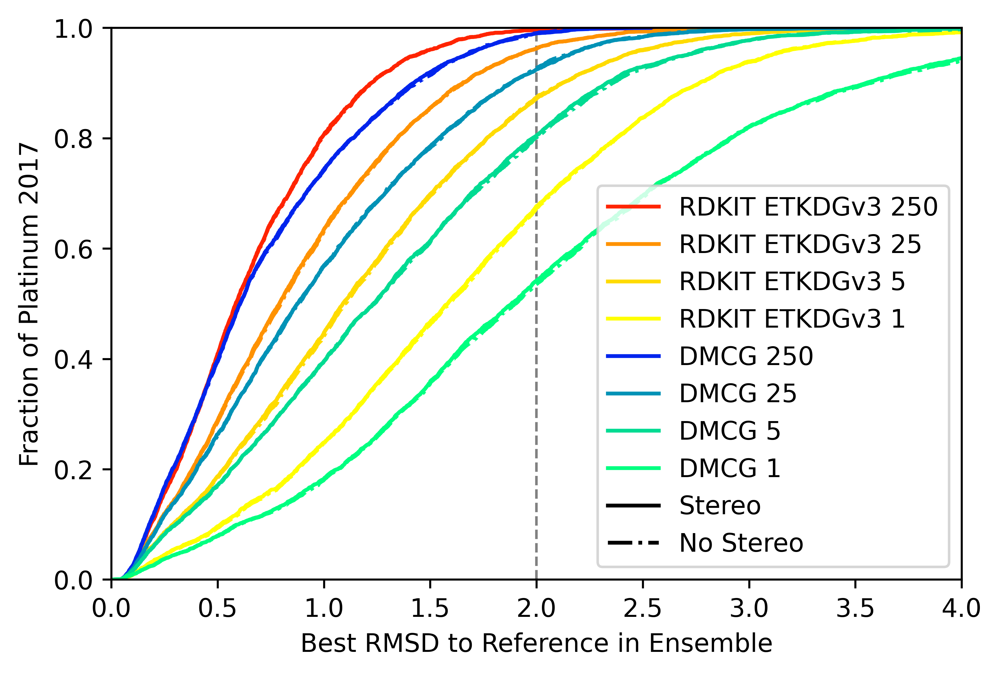

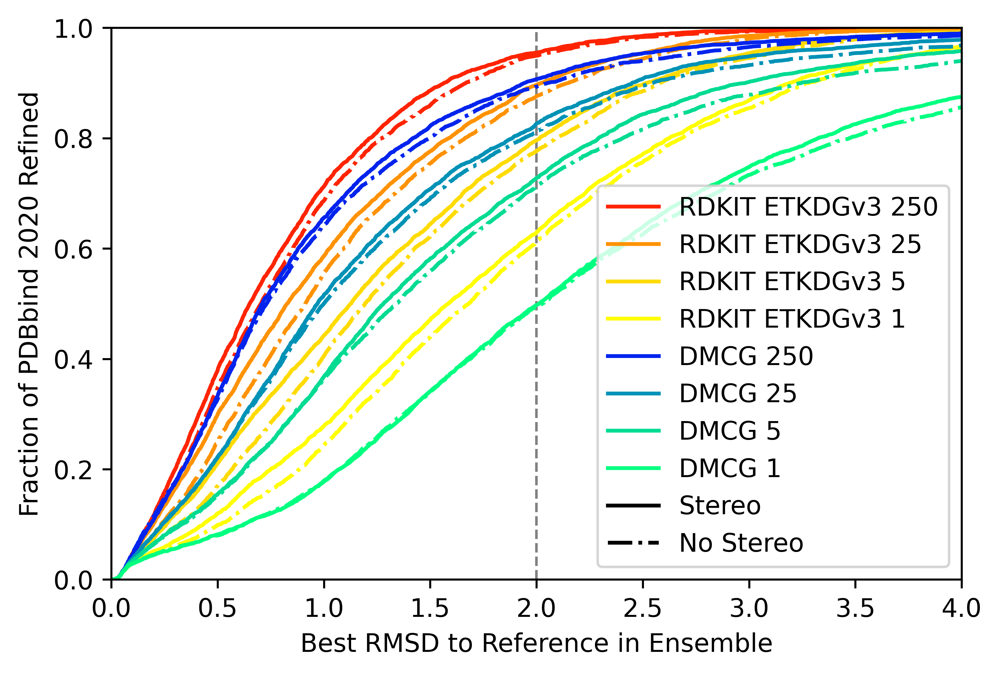

In [40]:
        
for b in ['platinum2017','refined-set']:
    plt.figure(figsize=(6,4),dpi=600)
    plt.axvline(2,color='gray',linestyle='--',linewidth=1)    
    bench = D[(D.bench == b)] 
    for a in ['rdkitetkdg','dmcg']:
        for N in [250,25,5,1]:
            for nosc in [False,True]:
                df = bench[(bench.minimized=='min') & (bench.nosc  == nosc) & (bench.approach == a) & (bench.pos < N)]
                df = df.groupby(['approach','base','fname'])[['rmsd']].min().reset_index()            
                r = df.sort_values(by='rmsd').rmsd
                r = np.array(r)
                plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),
                         linestyle = '-' if not nosc else '-.',
                         label=f'{names[a]} {N}' if not nosc else None, color=colors[a][N])
                
    plt.gca().add_line(Line2D([0], [0], color='black',label='Stereo'))
    plt.gca().add_line(Line2D([0], [0], linestyle='-.', color='black',label='No Stereo'))

    plt.xlim(0,4)
    plt.ylim(0,1)
    plt.xlabel('Best RMSD to Reference in Ensemble')
    plt.ylabel(f'Fraction of {names[b]}')
    plt.legend();
    plt.savefig(f'stereo_{b}.pdf',bbox_inches='tight')

Compare RDKit to DMCG

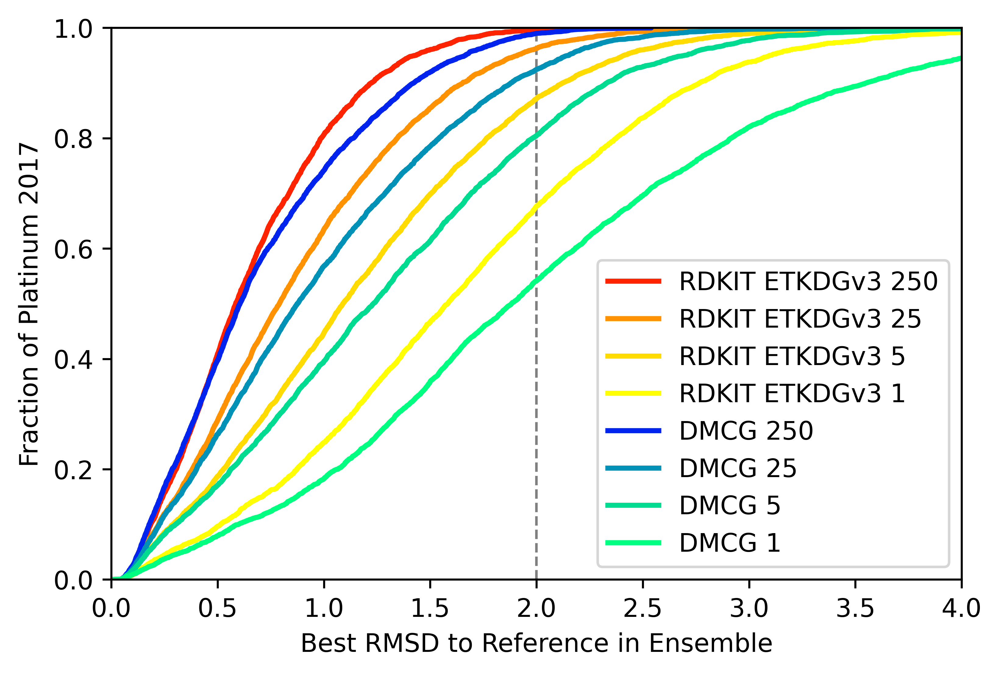

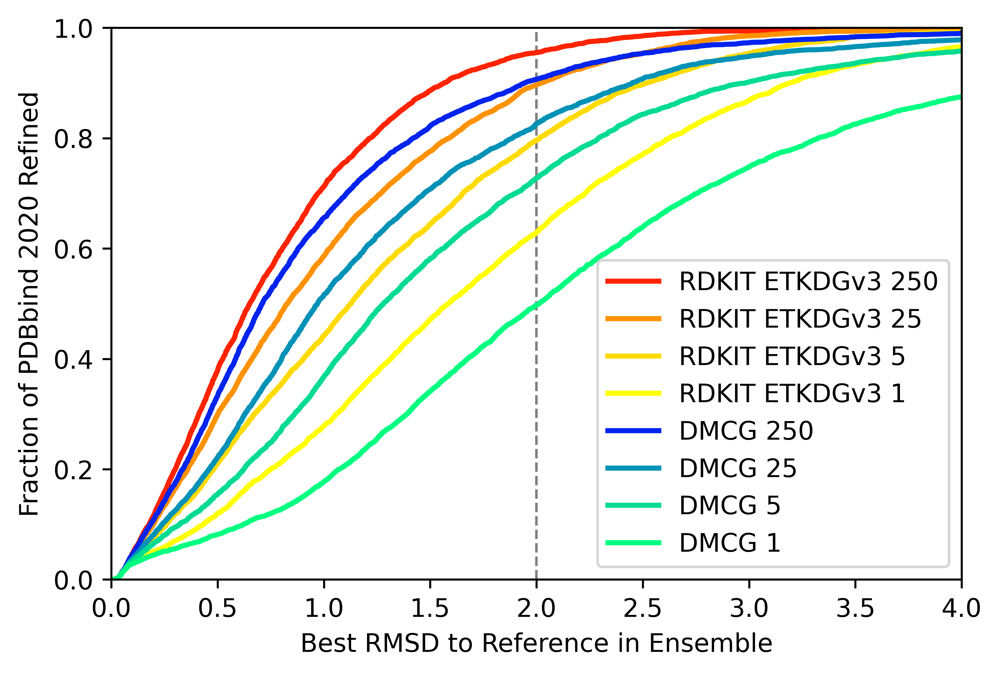

In [21]:
for b in ['platinum2017','refined-set']:
    bench = D[(D.bench == b)] 
    plt.figure(figsize=(6,4),dpi=600)
    plt.axvline(2,color='gray',linestyle='--',linewidth=1)    
    for a in ['rdkitetkdg','dmcg']:
        for m in D.minimized.unique():
            for N in sorted([1,5,25,250],reverse=True): #subset_sizes:
                df = bench[(bench.pos < N) & (bench.minimized == "min")]
                df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
                r = df[~df.nosc & (df.approach == a) & (df.minimized == m)].sort_values(by='rmsd').rmsd
                r = np.array(r)
                plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),'-' if m == 'min' else '--', 
                         linewidth= 1 if m == 'unmin' else 2,
                         label=f'{names[a]} {N}' if m == "min" else None, 
                         color=colors[a][N])
                               
    plt.xlim(0,4)
    plt.ylim(0,1)
    plt.xlabel('Best RMSD to Reference in Ensemble')
    plt.ylabel(f'Fraction of {names[b]}')
    plt.legend();
    plt.savefig(f'methodeval_{b}.pdf',bbox_inches='tight')

Evaluate different ensemble sizes

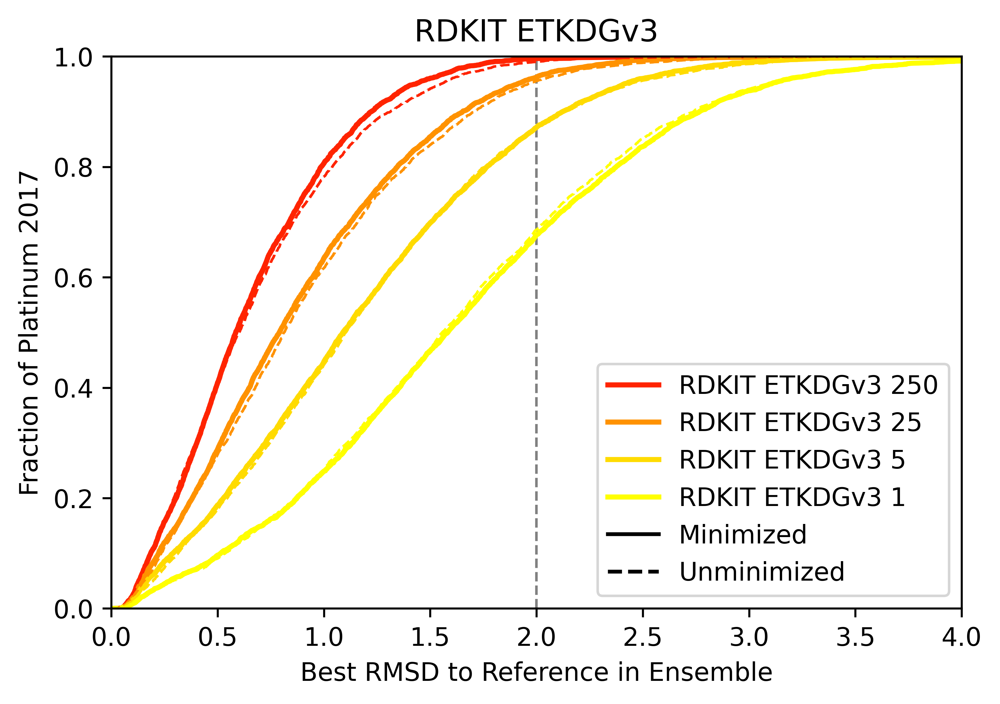

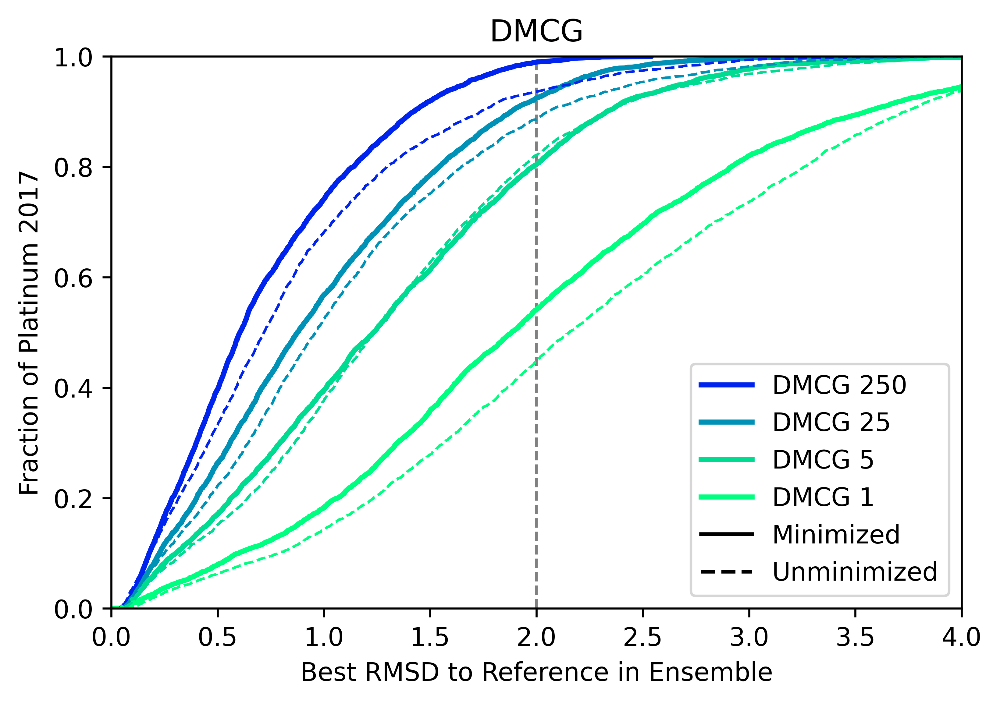

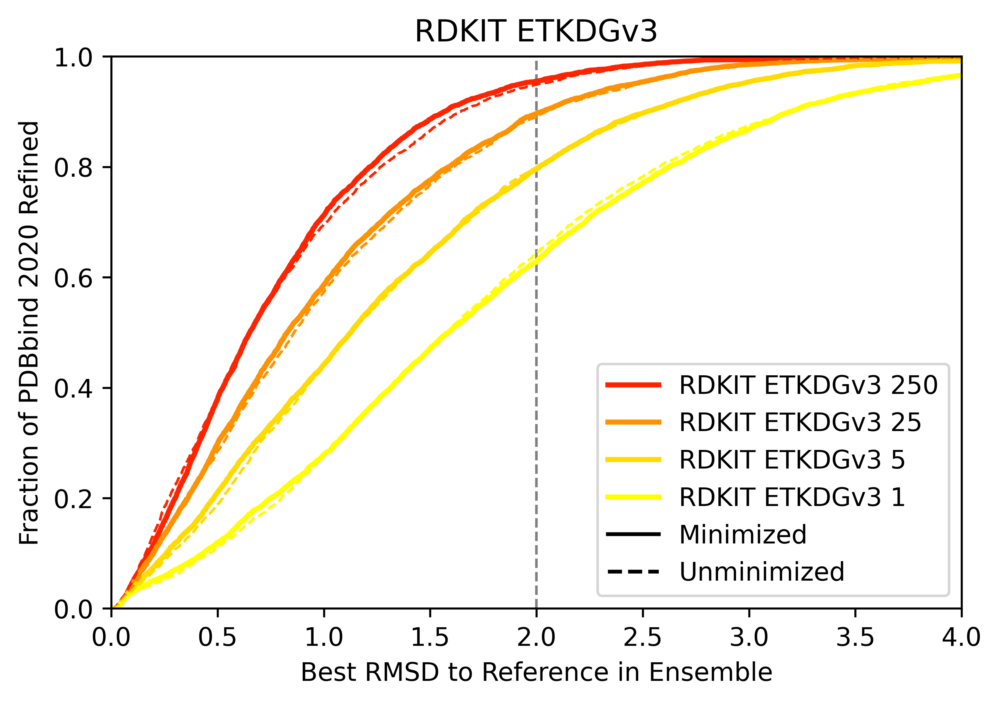

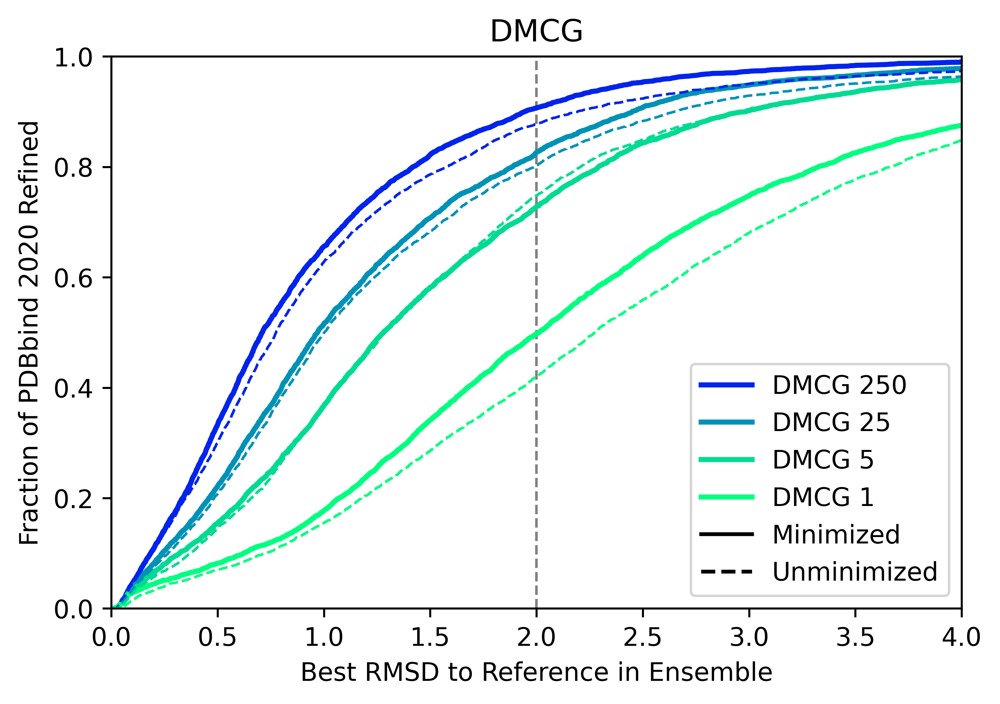

In [22]:

for b in ['platinum2017','refined-set']:
    bench = D[(D.bench == b) & (D.nosc == False)] 
    for a in ['rdkitetkdg','dmcg']:
        plt.figure(figsize=(6,4),dpi=600)
        plt.axvline(2,color='gray',linestyle='--',linewidth=1)
        for m in D.minimized.unique():
            for N in sorted([1,5,25,250],reverse=True): #subset_sizes:
                df = bench[bench.pos < N]
                df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
                r = df[ (df.approach == a) & (df.minimized == m)].sort_values(by='rmsd').rmsd
                r = np.array(r)
                plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),'-' if m == 'min' else '--', 
                         linewidth= 1 if m == 'unmin' else 2,
                         label=f'{names[a]} {N}' if m == "min" else None, 
                         color=colors[a][N])
                
        plt.gca().add_line(Line2D([0], [0], color='black',label='Minimized'))
        plt.gca().add_line(Line2D([0], [0], linestyle='--', color='black',label='Unminimized'))
                
        plt.xlim(0,4)
        plt.ylim(0,1)
        plt.xlabel('Best RMSD to Reference in Ensemble')
        plt.ylabel(f'Fraction of {names[b]}')
        plt.title(names[a])
        plt.legend();
        plt.savefig(f'mineval_{b}_{a}.pdf',bbox_inches='tight')

Evaluate at 2 RMSD

In [23]:
rmsd2fracs = []
for b in ['platinum2017','refined-set']:
    bench = D[(D.bench == b) & (D.nosc == False)] 
    for a in ['rdkitetkdg','dmcg']:
        for m in ['min','unmin']:
            benchm = bench[bench.minimized == m]
            for N in subset_sizes: #subset_sizes:
                df = benchm[(benchm.pos < N)]
                df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
                r = df[(df.approach == a)].rmsd
                frac = np.count_nonzero(r < 2)/len(r)
                
                rmsd2fracs.append([names[b],names[a]+' '+m,N,frac])
                

In [24]:
rmsd2 = pd.DataFrame(rmsd2fracs,columns=['Dataset','Method','Size of Ensemble','Fraction With <2Å RMSD Conformer'])

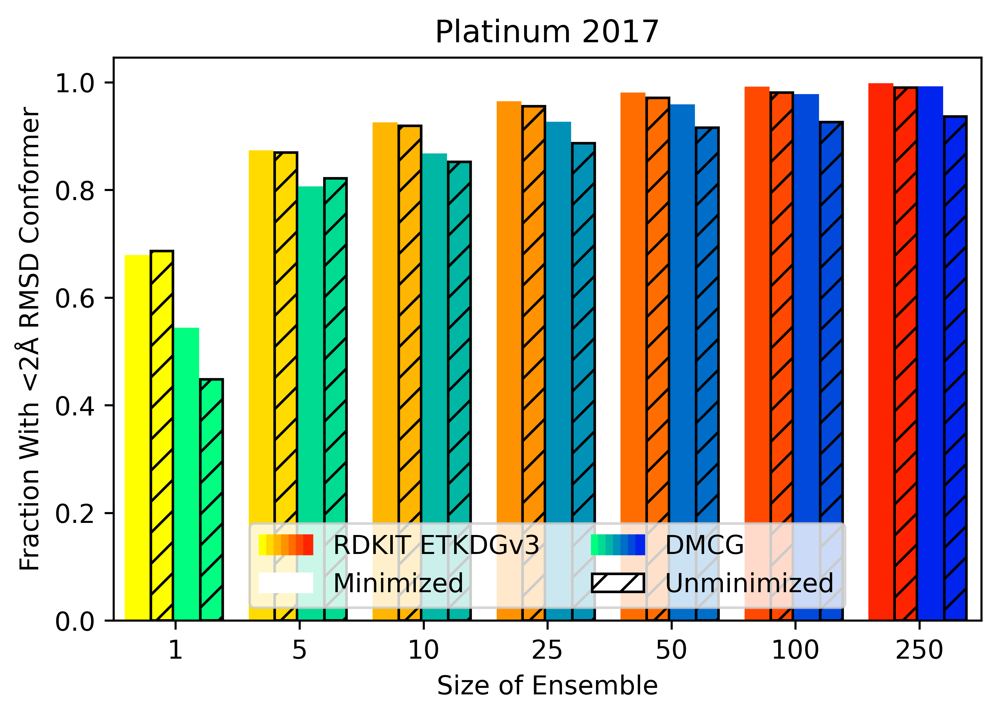

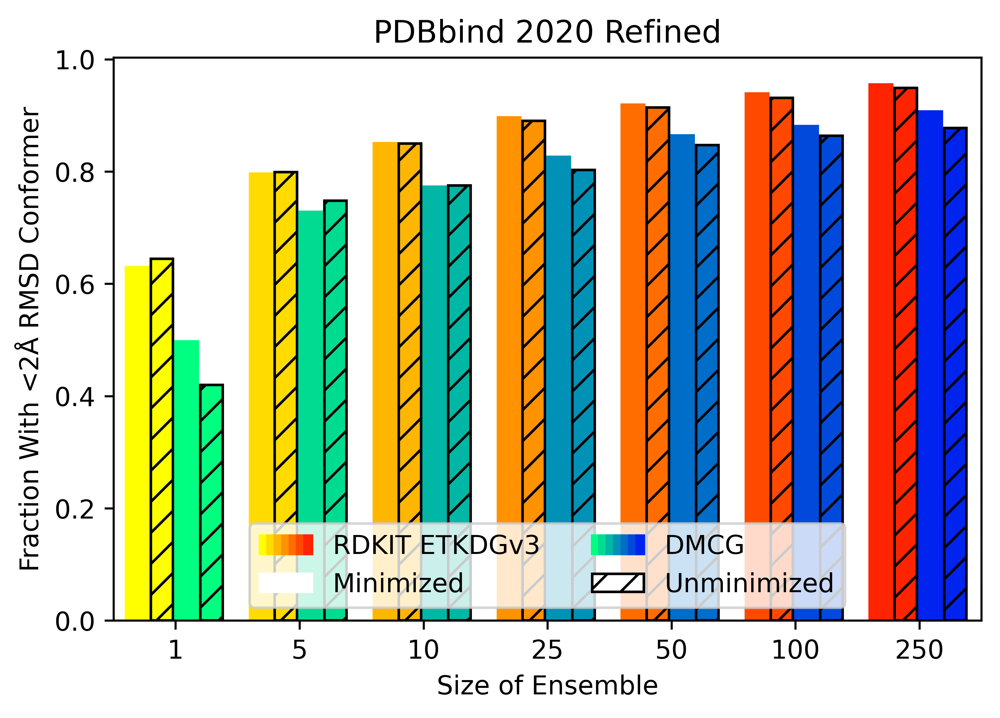

In [25]:
for b in ['platinum2017','refined-set']:
 
    plt.figure(figsize=(6,4),dpi=600)
    bars = sns.barplot(data=rmsd2[rmsd2.Dataset==names[b]],hue='Method',
                       y='Fraction With <2Å RMSD Conformer',x='Size of Ensemble',linewidth=1)
    rdbars = []
    dbars = []
    N = len(subset_sizes)
    boxes = bars.get_children()
    w = 0.18
    for i, n in enumerate(subset_sizes):
        boxes[i].set_color(colors['rdkitetkdg'][n])
        boxes[i].set_width(w)
        boxes[i+N].set_color(colors['rdkitetkdg'][n])
        boxes[i+N].set_hatch('//')
        boxes[i+N].set_edgecolor('black')
        boxes[i+N].set_width(w)

        rdbars.append(boxes[i])
        
        boxes[i+2*N].set_color(colors['dmcg'][n])  
        boxes[i+2*N].set_width(w)

        boxes[i+3*N].set_color(colors['dmcg'][n])    
        boxes[i+3*N].set_hatch('//')
        boxes[i+3*N].set_edgecolor('black')
        boxes[i+3*N].set_width(w)

        dbars.append(boxes[i+2*N])  
              
    rdbars = tuple(rdbars)
    dbars = tuple(dbars)

    l = plt.legend((rdbars,Rectangle([0,0],0,0,color='white'),dbars,
                    Rectangle([0,0],0,0,facecolor='white',edgecolor='black',hatch='//')),
                   [names['rdkitetkdg'],'Minimized',names['dmcg'],'Unminimized'],
                   loc='lower center',ncol=2,
                  handler_map={tuple: HandlerTuple(ndivide=None,pad=0)})
    plt.title(names[b])
    plt.savefig(f'rmds2_{b}.pdf',bbox_inches='tight')

In [26]:
D

,bench,fname,base,nosc,nrot,approach,pos,minimized,rmsd,energy,erank
0,platinum2017,3VQP_dmcg_250_min.sdf.gz,platinum2017/3VQP,False,1,dmcg,0,min,0.487394,21.945676,51.0
1,platinum2017,3VQP_dmcg_250_min.sdf.gz,platinum2017/3VQP,False,1,dmcg,1,min,0.367312,22.384564,242.0
2,platinum2017,3VQP_dmcg_250_min.sdf.gz,platinum2017/3VQP,False,1,dmcg,2,min,0.531214,22.014454,92.0
3,platinum2017,3VQP_dmcg_250_min.sdf.gz,platinum2017/3VQP,False,1,dmcg,3,min,0.402519,22.356252,149.0
4,platinum2017,3VQP_dmcg_250_min.sdf.gz,platinum2017/3VQP,False,1,dmcg,4,min,0.487399,21.945676,54.0
...,...,...,...,...,...,...,...,...,...,...,...
245,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,245,unmin,2.521100,0.000000,125.5
246,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,246,unmin,4.566870,0.000000,125.5
247,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,247,unmin,3.093480,0.000000,125.5
248,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,248,unmin,4.864480,0.000000,125.5


In [27]:
bench.erank.min()

1.0

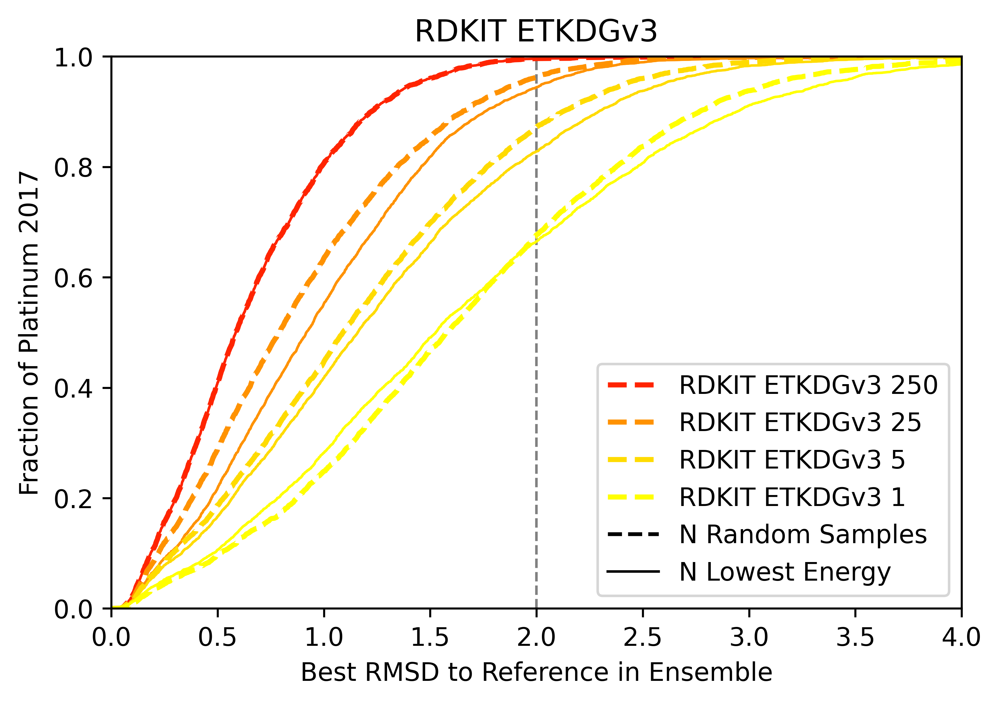

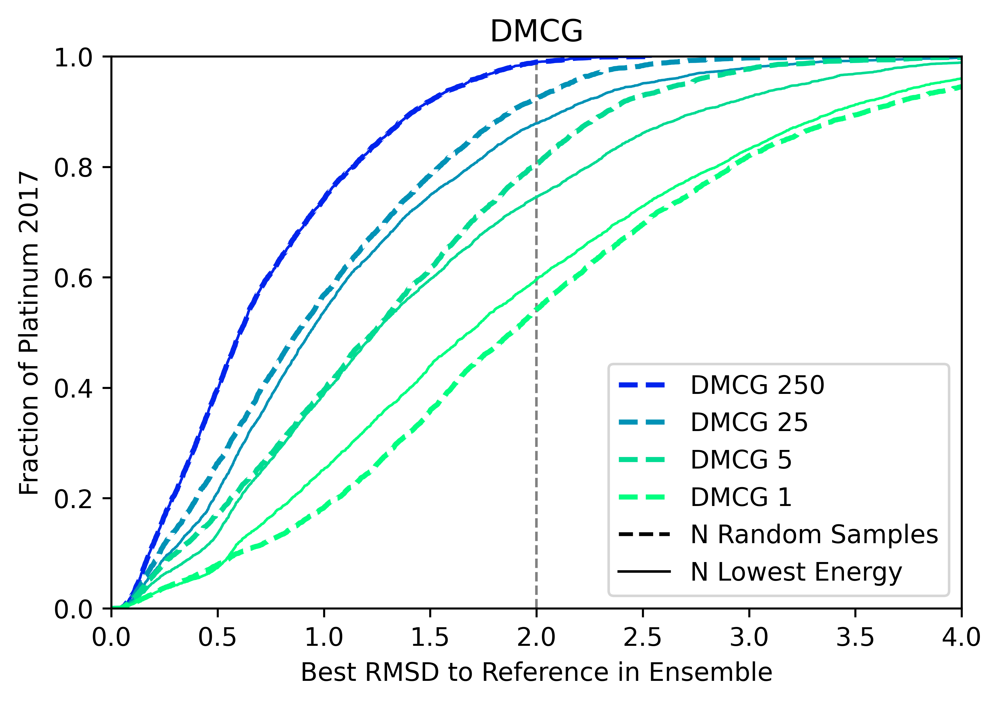

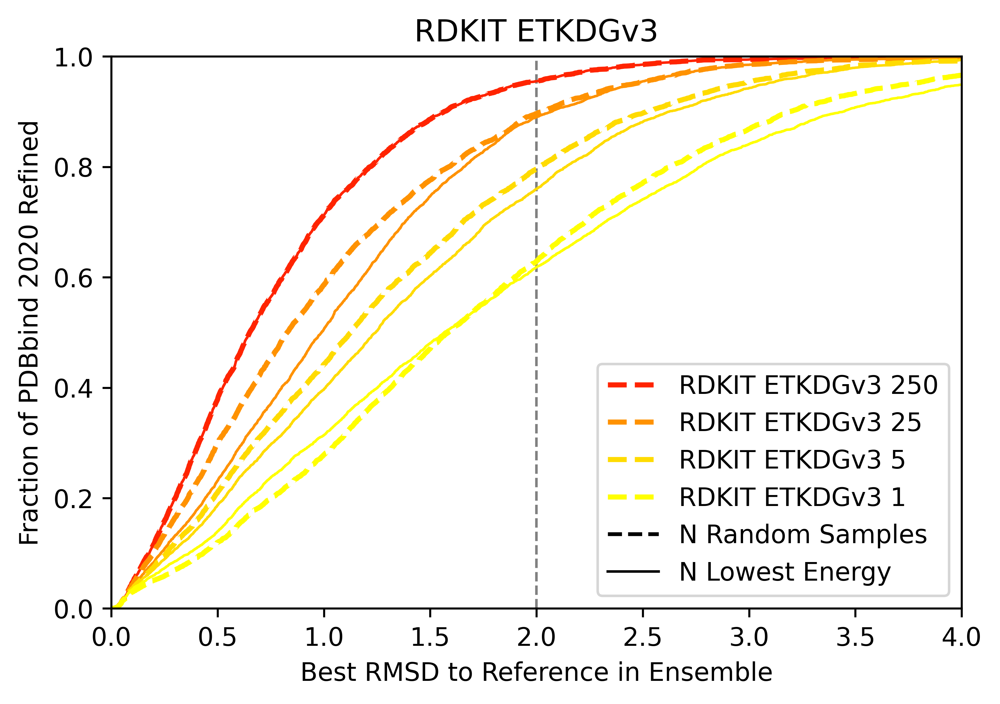

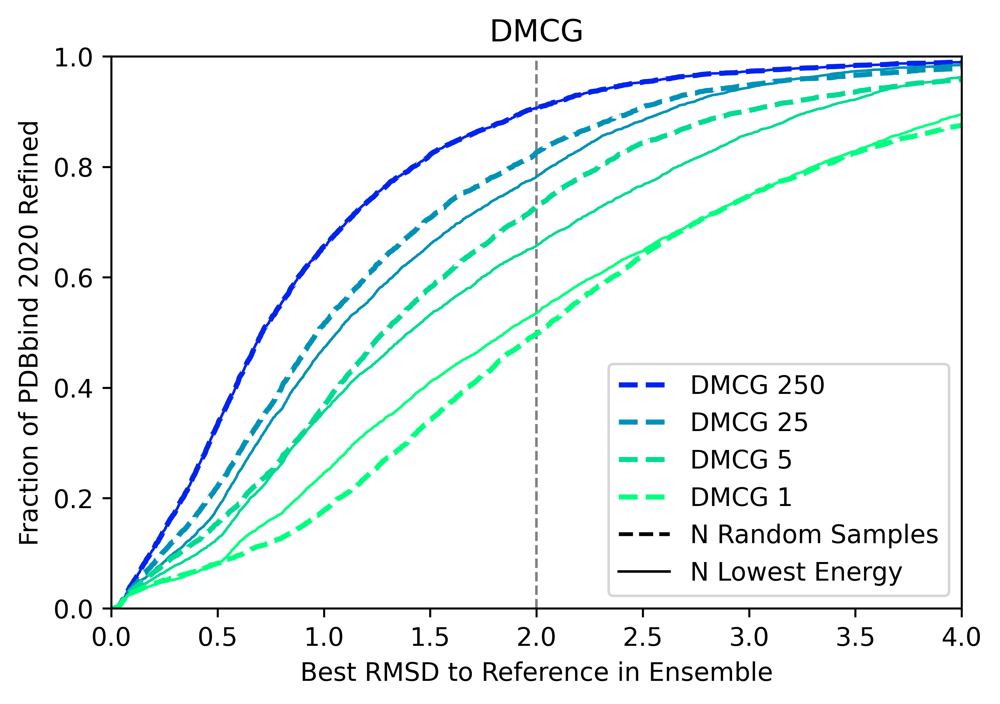

In [28]:

for b in ['platinum2017','refined-set']:
    bench = D[(D.bench == b)&(D.nosc == False)&(D.minimized == "min")] 
    for a in ['rdkitetkdg','dmcg']:
        plt.figure(figsize=(6,4),dpi=600)
        plt.axvline(2,color='gray',linestyle='--',linewidth=1)
        for N in sorted([1,5,25,250],reverse=True): #subset_sizes:
            df = bench[bench.pos < N]
            df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
            r = df[(df.approach == a) ].sort_values(by='rmsd').rmsd
            r = np.array(r)
            plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),'-' if m == 'min' else '--', 
                     linewidth=2, label=f'{names[a]} {N}',
                     color=colors[a][N])

            #take N lowest energy
            df = bench[bench.erank <= N]
            df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
            r = df[ (df.approach == a)].sort_values(by='rmsd').rmsd
            r = np.array(r)
            plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),
                     linewidth=1,label=None,
                     color=colors[a][N])                
                
                
        plt.gca().add_line(Line2D([0], [0], color='black',linestyle='--',label='N Random Samples'))
        plt.gca().add_line(Line2D([0], [0], linewidth=1, color='black',label='N Lowest Energy'))
                
        plt.xlim(0,4)
        plt.ylim(0,1)
        plt.xlabel('Best RMSD to Reference in Ensemble')
        plt.ylabel(f'Fraction of {names[b]}')
        plt.title(names[a])
        plt.legend();
        plt.savefig(f'lowenergy_{b}_{a}.pdf',bbox_inches='tight')

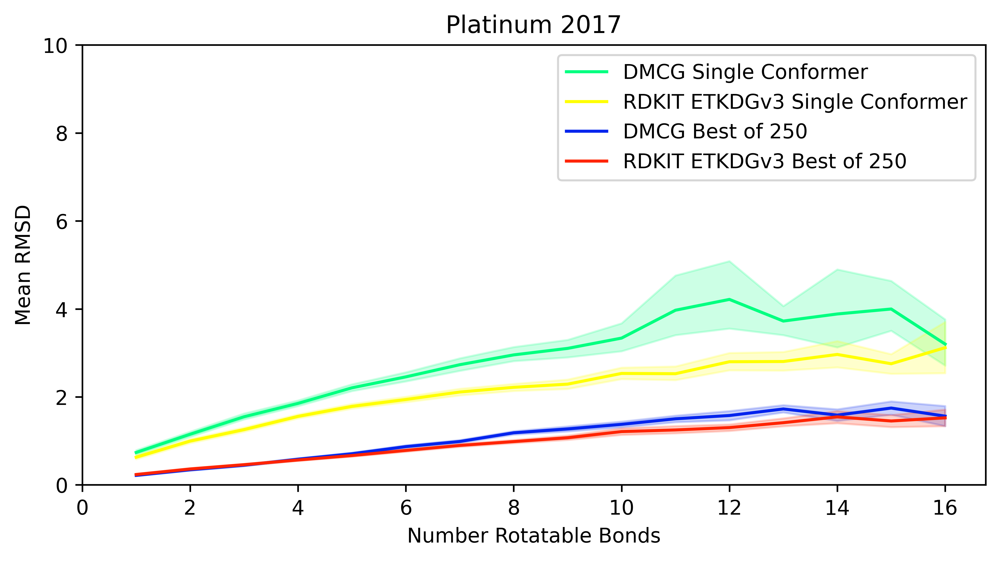

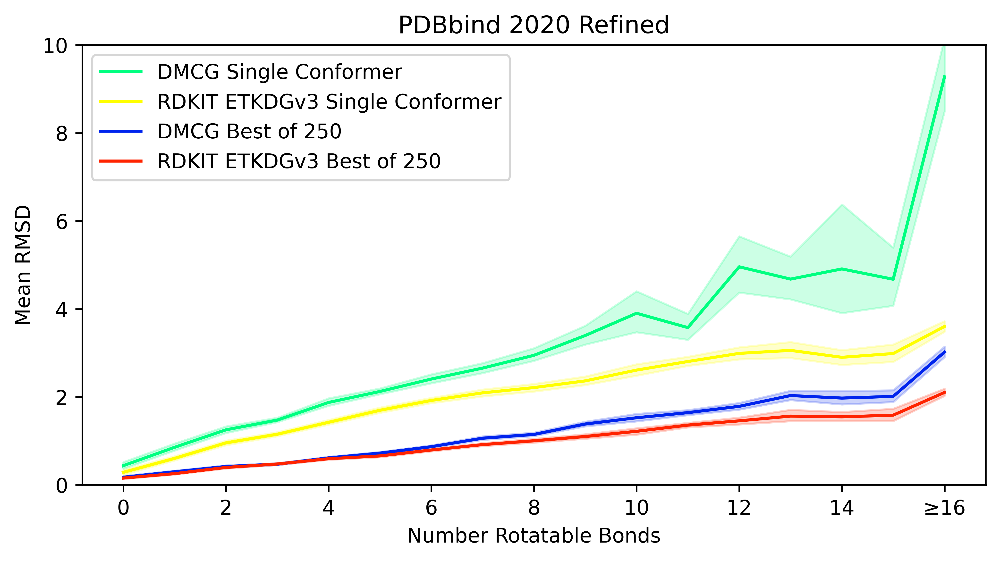

In [29]:

for b in ['platinum2017','refined-set']:
    firsts = D[(D.bench == b)&(D.nosc == False)&(D.minimized == "min")&(D.pos == 0)&(D.approach != 'rdkitdg')].copy() 

    firsts['nrot16'] = np.clip(firsts.nrot,0,16)
    
    plt.figure(figsize=(8,4),dpi=600)
    lines = sns.lineplot(data=firsts,x='nrot16',y='rmsd',hue='approach',hue_order=['dmcg','rdkitetkdg'],
                         palette=[colors['dmcg'][1], colors['rdkitetkdg'][1]])
    
    df = D[(D.bench == b)&(D.nosc == False)&(D.minimized == "min")&(D.approach != 'rdkitdg')].copy() 
    df = df.groupby(['nosc','approach','minimized','base','fname','nrot'])[['rmsd']].min().reset_index()    
    df['nrot16'] = np.clip(df.nrot,0,16)
    lines = sns.lineplot(data=df,x='nrot16',y='rmsd',hue='approach',hue_order=['dmcg','rdkitetkdg'],
                         palette=[colors['dmcg'][250], colors['rdkitetkdg'][250]],ax=lines)    
    plt.ylabel('Mean RMSD')
    plt.xlabel('Number Rotatable Bonds')
    plt.title(names[b])
    plt.xticks(ticks=range(0,17,2),labels=[0,2,4,6,8,10,12,14,"≥16" if b == 'refined-set' else '16']);
    plt.legend(lines.get_legend_handles_labels()[0][1:3]+lines.get_legend_handles_labels()[0][4:],
               [names['dmcg']+' Single Conformer',names['rdkitetkdg']+' Single Conformer',
                names['dmcg']+' Best of 250',names['rdkitetkdg']+' Best of 250']);
    plt.ylim(0,10)
    plt.savefig(f'rmsd_vs_nrot_{b}.pdf',bbox_inches='tight')

Evaluate filtering energy sorted lists by intra-ensemble RMSD.

In [30]:
def process_poses(poses, threshold, N):
    '''Process poses, which is a dataframe of the 250 conformer ensemble.
    Take the lowest N energy posest that are more than the specified RMSD threshold apart.
    '''
    assert(len(poses.base.unique()) == 1)
    assert(len(poses.fname.unique()) == 1)
    try:
        base = poses.base[0]
        fname = poses.fname[0]
        rmsfile = '/'.join(base.split('/')[:-1]) +'/'+ fname.replace('.sdf.gz','.crms.npy')
        R = np.load(rmsfile)
        refrmsds = poses.rmsd.to_numpy()
        sindex = np.argsort(poses.energy.to_numpy())

        selected = []
        for i in sindex:
            for s in selected:
                if R[i,s] < threshold: # too close to already selected
                    break
            else: # made it through without breaking
                selected.append(i)

        return refrmsds[selected][:N].min()
    except Exception as e:
        print(fname,e)
        return None

This takes a while so separate data analysis from plotting.

In [31]:
rmsdf = {}
for b in ['platinum2017','refined-set']:
    bench = D[(D.bench == b)&(D.nosc == False)&(D.minimized == "min")] 
    rmsdf[b] = {}
    for a in ['rdkitetkdg','dmcg']:
        rmsdf[b][a] = {}      
        
        df = bench[bench.approach == a]
        df = df.groupby(['nosc','approach','minimized','base','fname'])       
        

        for N in [5,25,100]:
            rmsdf[b][a][N] = {}

            unfilt = bench[(bench.pos < N) & (bench.approach == a)]
            unfilt = unfilt.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()    
            rmsdf[b][a][N][0] = unfilt # NOT sorted by energy
        
            for threshold in [0.25,0.5,0.75,1.0,1.5,2.0]:
                print(b,a,N,threshold)
                rmsdf[b][a][N][threshold] = df.apply(process_poses,threshold,N)
            

platinum2017 rdkitetkdg 5 0.25
platinum2017 rdkitetkdg 5 0.5
platinum2017 rdkitetkdg 5 0.75
platinum2017 rdkitetkdg 5 1.0
platinum2017 rdkitetkdg 5 1.5
platinum2017 rdkitetkdg 5 2.0
platinum2017 rdkitetkdg 25 0.25
platinum2017 rdkitetkdg 25 0.5
platinum2017 rdkitetkdg 25 0.75
platinum2017 rdkitetkdg 25 1.0
platinum2017 rdkitetkdg 25 1.5
platinum2017 rdkitetkdg 25 2.0
platinum2017 rdkitetkdg 100 0.25
platinum2017 rdkitetkdg 100 0.5
platinum2017 rdkitetkdg 100 0.75
platinum2017 rdkitetkdg 100 1.0
platinum2017 rdkitetkdg 100 1.5
platinum2017 rdkitetkdg 100 2.0
platinum2017 dmcg 5 0.25
platinum2017 dmcg 5 0.5
platinum2017 dmcg 5 0.75
platinum2017 dmcg 5 1.0
platinum2017 dmcg 5 1.5
platinum2017 dmcg 5 2.0
platinum2017 dmcg 25 0.25
platinum2017 dmcg 25 0.5
platinum2017 dmcg 25 0.75
platinum2017 dmcg 25 1.0
platinum2017 dmcg 25 1.5
platinum2017 dmcg 25 2.0
platinum2017 dmcg 100 0.25
platinum2017 dmcg 100 0.5
platinum2017 dmcg 100 0.75
platinum2017 dmcg 100 1.0
platinum2017 dmcg 100 1.5
platin

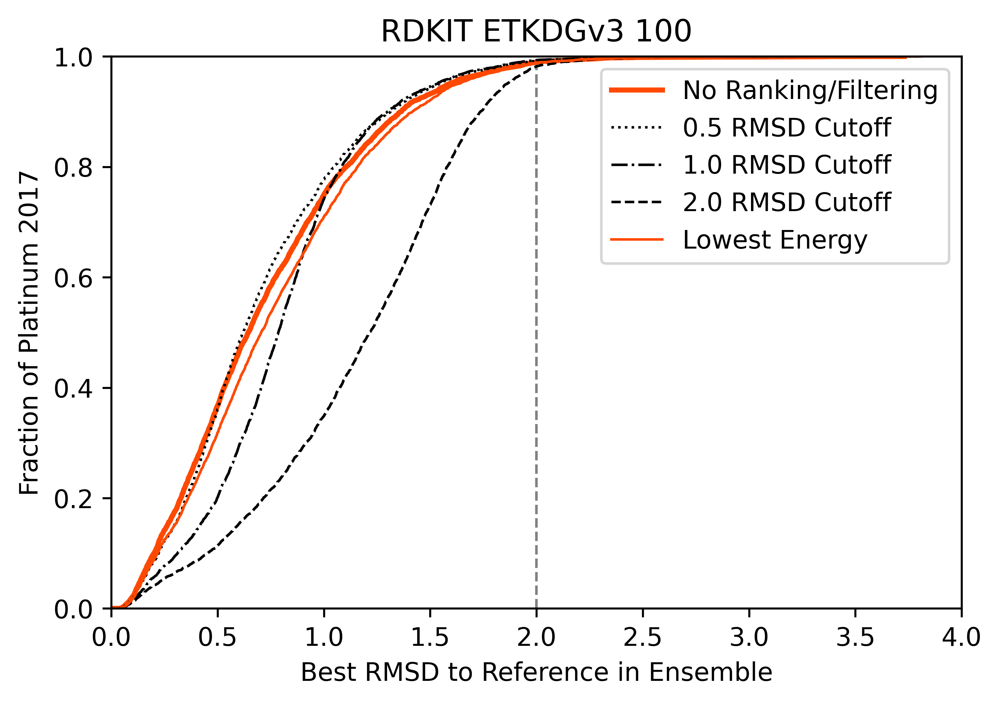

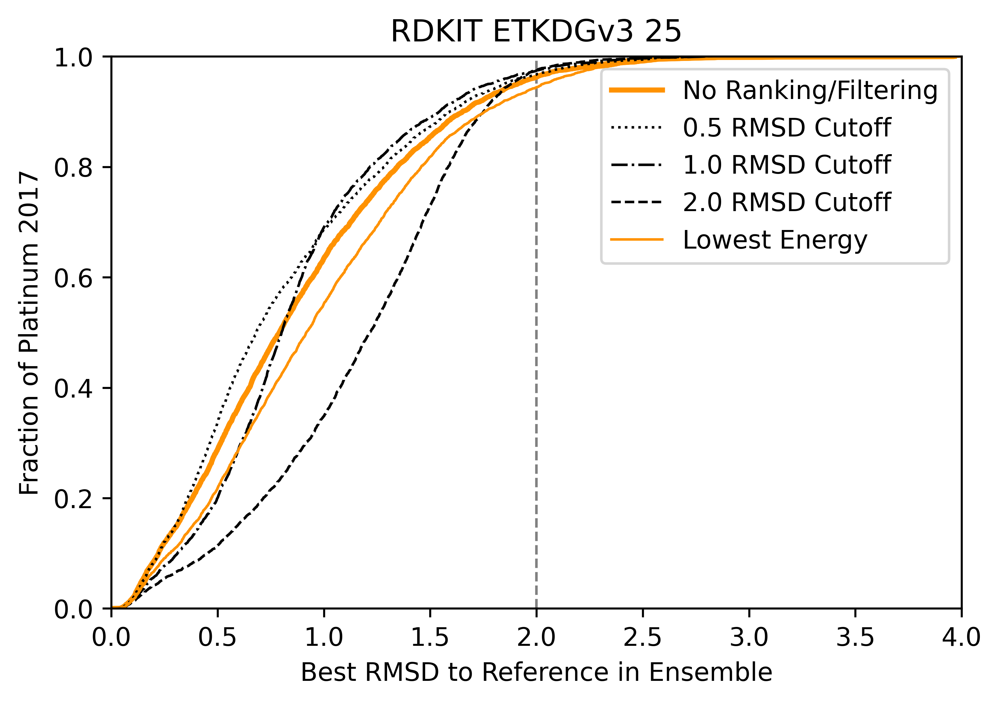

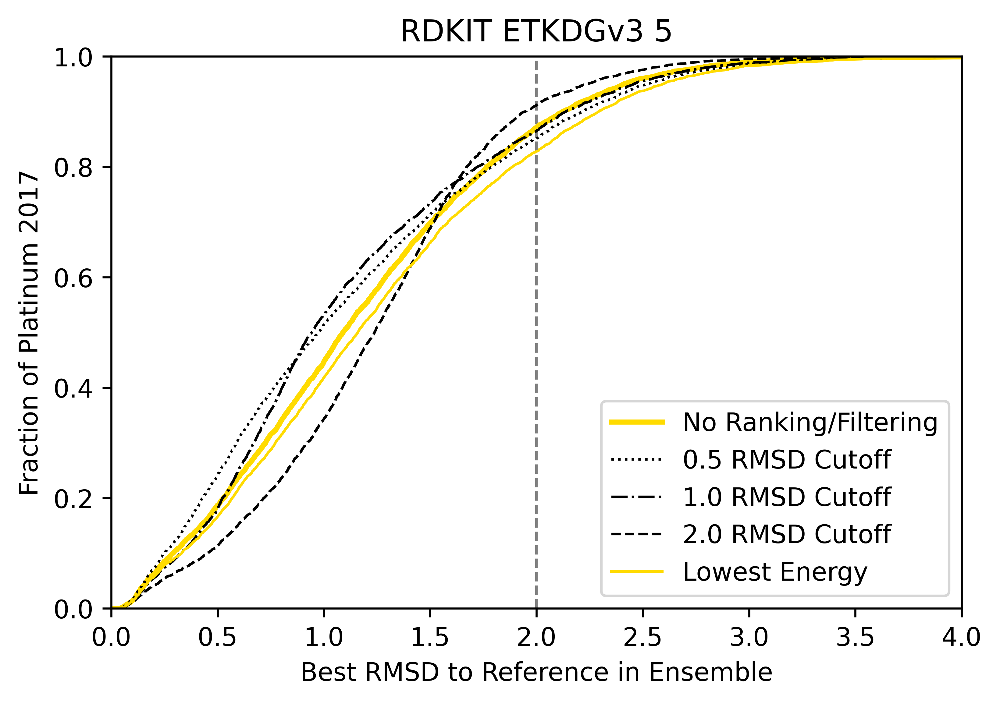

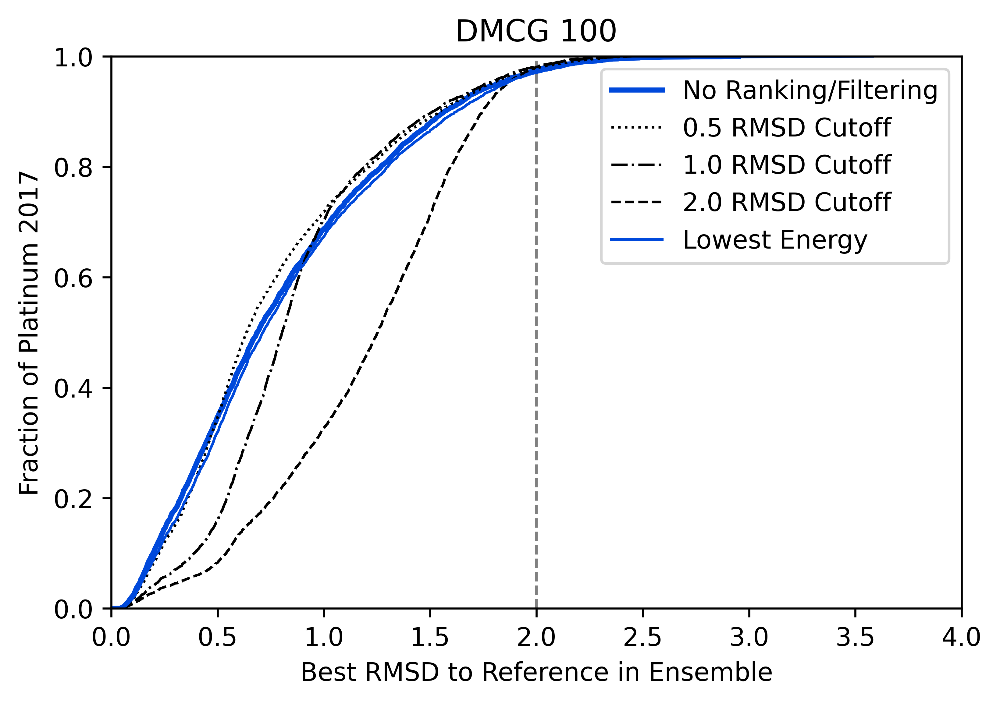

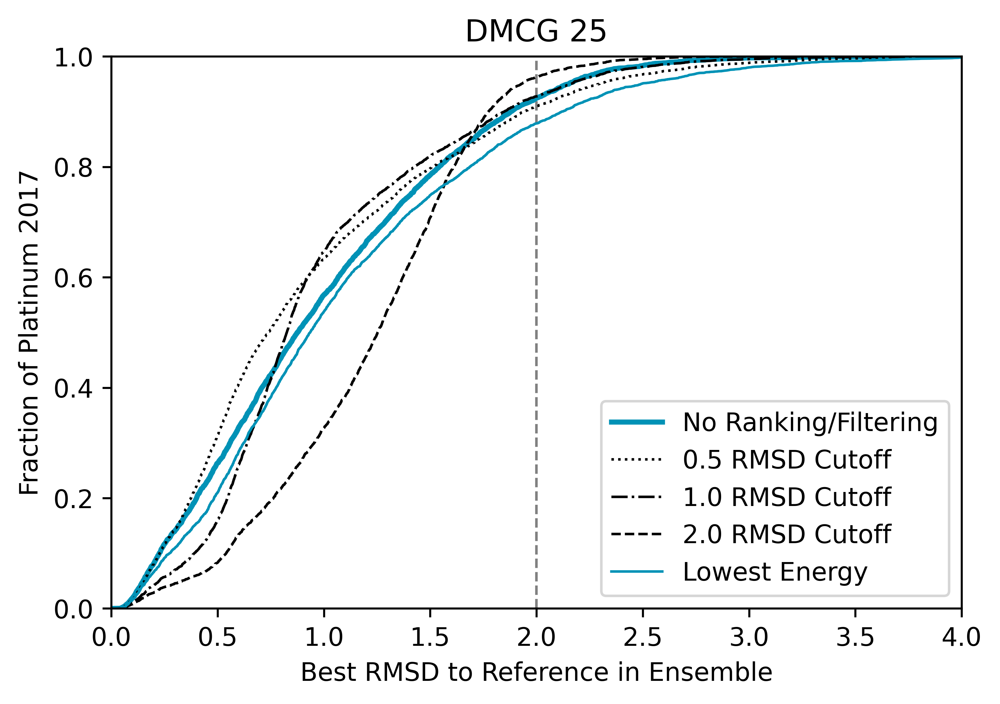

...

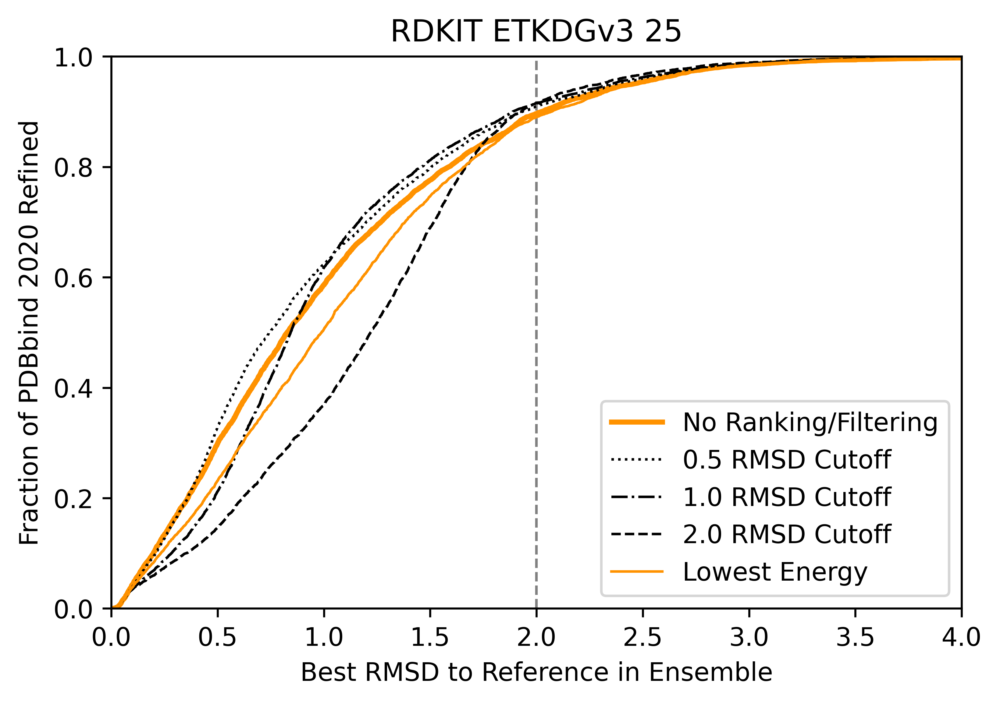

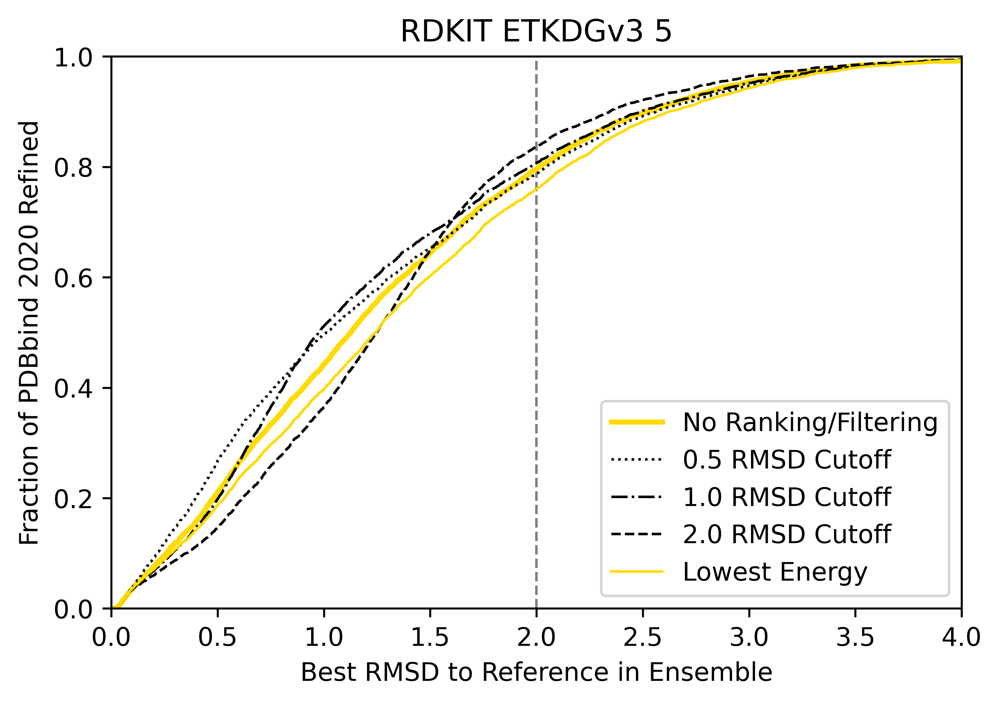

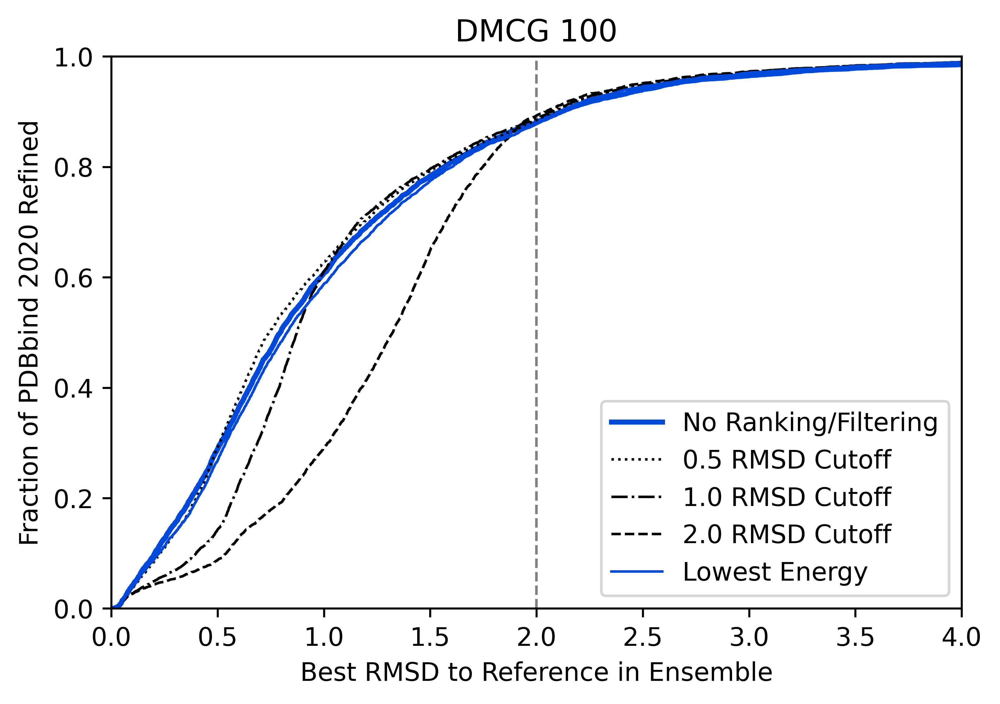

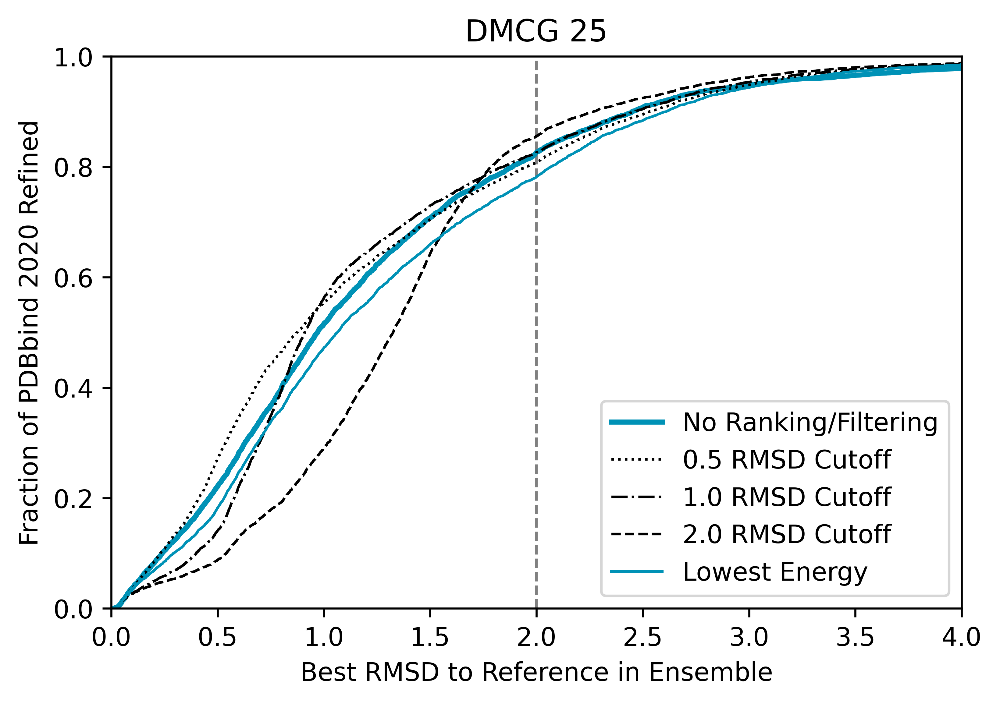

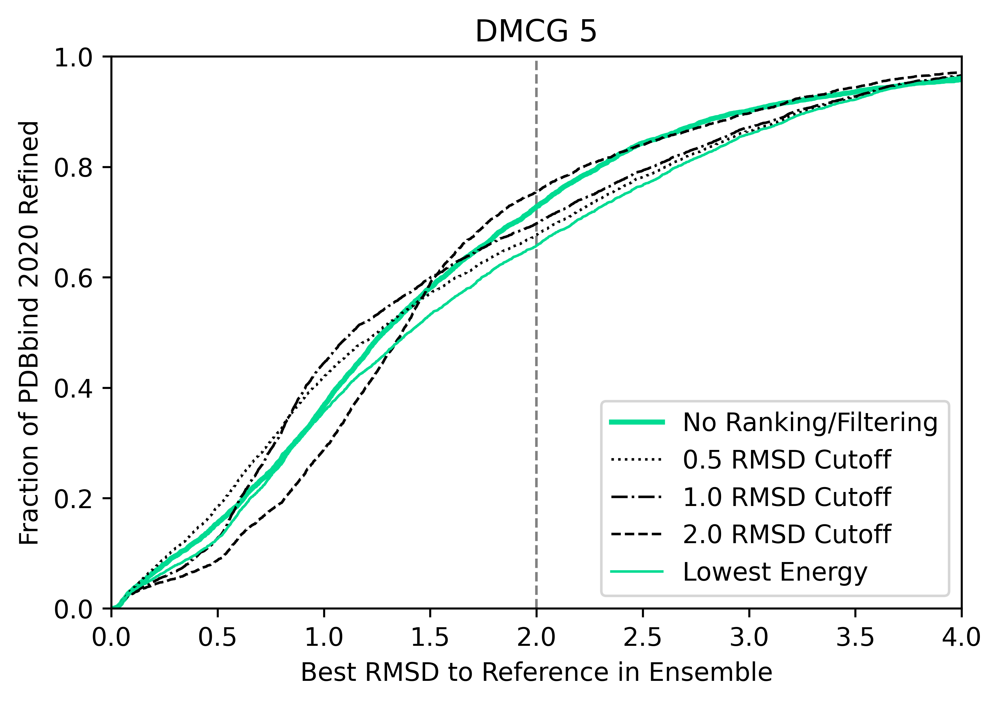

In [32]:
for b in ['platinum2017','refined-set']:
    for a in ['rdkitetkdg','dmcg']:

        bench = D[(D.bench == b)&(D.nosc == False)&(D.minimized == "min")] 

        for N in sorted([5,25,100],reverse=True): #subset_sizes:
            plt.figure(figsize=(6,4),dpi=600)
            plt.axvline(2,color='gray',linestyle='--',linewidth=1)
            r = rmsdf[b][a][N][0].sort_values(by='rmsd').rmsd
            r = np.array(r)
            plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),'-',  
                     linewidth=2, label=f'No Ranking/Filtering',
                     color=colors[a][N])

            #different thresholds
            for i,t in enumerate([0.5,1.0,2.0]):
                r = rmsdf[b][a][N][t].sort_values()
                r = np.array(r)
                plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),linestyle=['dotted','dashdot','dashed'][i],  
                         linewidth=1, label=f'{t} RMSD Cutoff',
                         color='black') #colors[a][N])
                
            df = bench[bench.erank <= N]
            df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
            r = df[ (df.approach == a)].sort_values(by='rmsd').rmsd
            r = np.array(r)
            plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),
                     linewidth=1,label=f'Lowest Energy',
                     color=colors[a][N])                
            
                
            plt.xlim(0,4)
            plt.ylim(0,1)
            plt.xlabel('Best RMSD to Reference in Ensemble')
            plt.ylabel(f'Fraction of {names[b]}')
            plt.title(f'{names[a]} {N}')
            plt.legend();
            plt.savefig(f'filtered_{b}_{a}_{N}.pdf',bbox_inches='tight')

In [33]:
Dwa3d[Dwa3d.approach == 'auto3d']

,bench,fname,base,nosc,nrot,approach,pos,minimized,rmsd,energy,erank
0,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,0,min,2.02643,0.0,88.5
1,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,1,min,1.96885,0.0,88.5
2,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,2,min,1.96883,0.0,88.5
3,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,3,min,1.98034,0.0,88.5
4,refined-set,5nw7_ligand_auto3d_250_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,auto3d,4,min,1.76856,0.0,88.5
...,...,...,...,...,...,...,...,...,...,...,...
234,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,234,min,3.75487,0.0,120.0
235,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,235,min,3.74450,0.0,120.0
236,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,236,min,3.71489,0.0,120.0
237,refined-set,1izi_ligand_auto3d_250_min.sdf.gz,refined-set/1izi/1izi_ligand,False,18,auto3d,237,min,4.12667,0.0,120.0


Auto3D analysis.  The default is to prune by RMS of 0.3 and by an energy window.

In [34]:
armsdf = {}
for b in ['refined-set']:
    bench = D[(D.bench == b)&(D.nosc == False)&(D.minimized == "min")] 
    armsdf[b] = {}
    for a in ['rdkitetkdg']:
        armsdf[b][a] = {}      
        
        df = bench[bench.approach == a]
        df = df.groupby(['nosc','approach','minimized','base','fname'])       
        

        for N in [1,5,25,100,250]:
            armsdf[b][a][N] = {}

            unfilt = bench[(bench.pos < N) & (bench.approach == a)]
            unfilt = unfilt.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()    
            armsdf[b][a][N][0] = unfilt # NOT sorted by energy
        
            for threshold in [0.3]:
                print(b,a,N,threshold)
                armsdf[b][a][N][threshold] = df.apply(process_poses,threshold,N)
            

refined-set rdkitetkdg 1 0.3
refined-set rdkitetkdg 5 0.3
refined-set rdkitetkdg 25 0.3
refined-set rdkitetkdg 100 0.3
refined-set rdkitetkdg 250 0.3


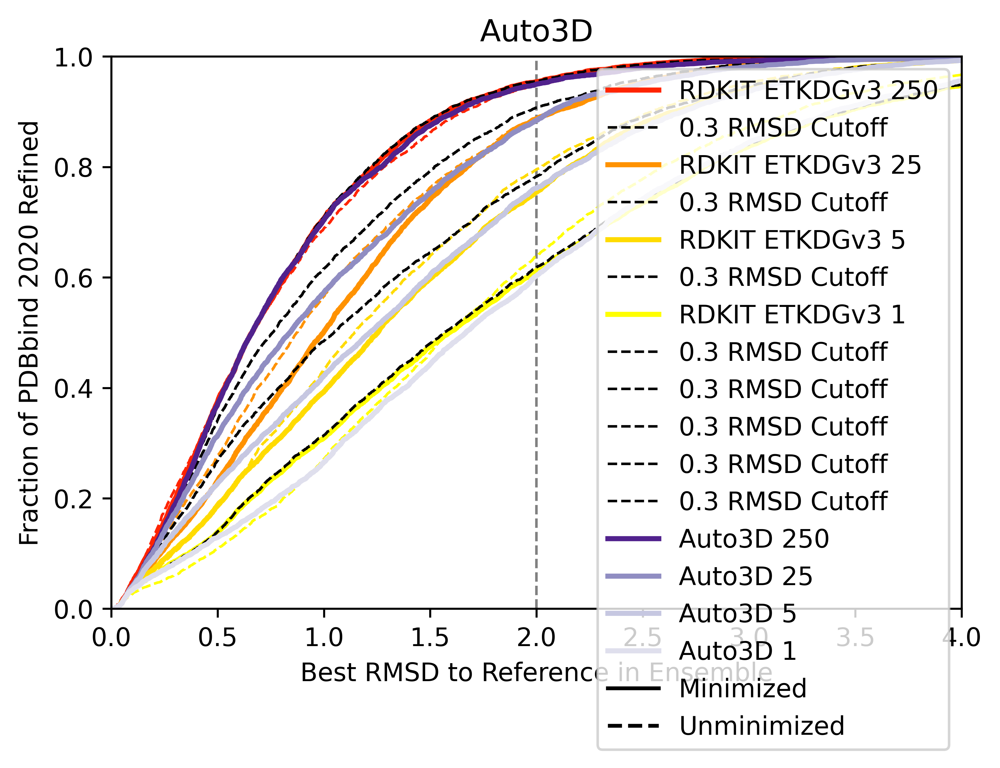

In [35]:

for b in ['refined-set']:
    bench = Dwa3d[(Dwa3d.bench == b) & (Dwa3d.nosc == False)] 
    plt.figure(figsize=(6,4),dpi=600)
    plt.axvline(2,color='gray',linestyle='--',linewidth=1)    
    for a in ['rdkitetkdg','auto3d']:
        for m in D.minimized.unique():
            for N in sorted([1,5,25,250],reverse=True): #subset_sizes:
                if m == 'min' and a == 'rdkitetkdg':
                    df = bench[bench.erank <= N]                    
                else:
                    df = bench[bench.pos < N]
                df = df.groupby(['nosc','approach','minimized','base','fname'])[['rmsd']].min().reset_index()            
                r = df[ (df.approach == a) & (df.minimized == m)].sort_values(by='rmsd').rmsd
                r = np.array(r)
                plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),'-' if m == 'min' else '--', 
                         linewidth= 1 if m == 'unmin' else 2,
                         label=f'{names[a]} {N}' if m == "min" else None, 
                         color=colors[a][N])
                
                if a != 'auto3d':
                    t = 0.3
                    r = armsdf[b][a][N][t].sort_values()
                    r = np.array(r)
                    plt.plot([0]+list(r),np.linspace(0,1,len(r)+1),linestyle=['dotted','dashdot','dashed'][i],  
                             linewidth=1, label=f'{t} RMSD Cutoff',
                             color='black') #colors[a][N])                
                
    plt.gca().add_line(Line2D([0], [0], color='black',label='Minimized'))
    plt.gca().add_line(Line2D([0], [0], linestyle='--', color='black',label='Unminimized'))

    plt.xlim(0,4)
    plt.ylim(0,1)
    plt.xlabel('Best RMSD to Reference in Ensemble')
    plt.ylabel(f'Fraction of {names[b]}')
    plt.title(names[a])
    plt.legend();
    plt.savefig(f'auto3deval_{b}_{a}.pdf',bbox_inches='tight')

In [36]:
Dwa3d

,bench,fname,base,nosc,nrot,approach,pos,minimized,rmsd,energy,erank
0,refined-set,5nw7_ligand_rdkit_250_dg_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,rdkitdg,0,min,1.410890,18.579006,67.0
1,refined-set,5nw7_ligand_rdkit_250_dg_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,rdkitdg,1,min,1.432630,20.592850,170.0
2,refined-set,5nw7_ligand_rdkit_250_dg_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,rdkitdg,2,min,0.885156,17.063653,5.0
3,refined-set,5nw7_ligand_rdkit_250_dg_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,rdkitdg,3,min,1.563450,21.838091,209.0
4,refined-set,5nw7_ligand_rdkit_250_dg_min.sdf.gz,refined-set/5nw7/5nw7_ligand,False,6,rdkitdg,4,min,1.532290,17.822704,24.0
...,...,...,...,...,...,...,...,...,...,...,...
245,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,245,unmin,2.521100,0.000000,125.5
246,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,246,unmin,4.566870,0.000000,125.5
247,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,247,unmin,3.093480,0.000000,125.5
248,refined-set,1izi_ligand_rdkit_250_dg_unmin.sdf.gz,refined-set/1izi/1izi_ligand,False,18,rdkitdg,248,unmin,4.864480,0.000000,125.5


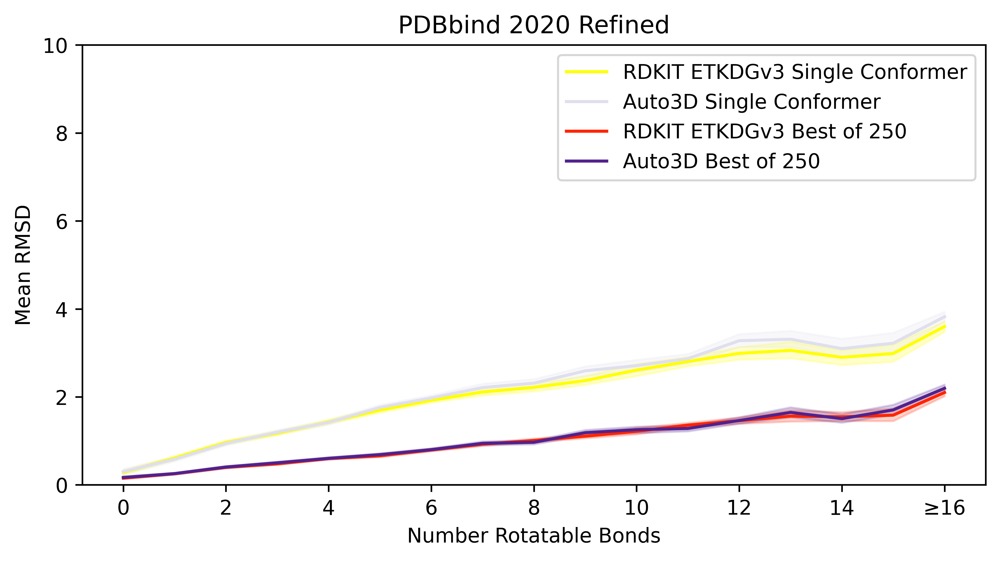

In [37]:

 b ='refined-set'
firsts = Dwa3d[(Dwa3d.bench == b)&(Dwa3d.nosc == False)&(Dwa3d.minimized == "min")&(Dwa3d.pos == 0)&(Dwa3d.approach != 'rdkitdg')].copy() 

firsts['nrot16'] = np.clip(firsts.nrot,0,16)
order = ['rdkitetkdg','auto3d']
plt.figure(figsize=(8,4),dpi=600)
lines = sns.lineplot(data=firsts,x='nrot16',y='rmsd',hue='approach',hue_order=order,
                     palette=[colors[a][1] for a in order])

df = Dwa3d[(Dwa3d.bench == b)&(Dwa3d.nosc == False)&(Dwa3d.minimized == "min")&(Dwa3d.approach != 'rdkitdg')].copy() 
df = df.groupby(['nosc','approach','minimized','base','fname','nrot'])[['rmsd']].min().reset_index()    
df['nrot16'] = np.clip(df.nrot,0,16)
lines = sns.lineplot(data=df,x='nrot16',y='rmsd',hue='approach',hue_order=order,
                     palette=[colors[a][250] for a in order],ax=lines)    
plt.ylabel('Mean RMSD')
plt.xlabel('Number Rotatable Bonds')
plt.title(names[b])
plt.xticks(ticks=range(0,17,2),labels=[0,2,4,6,8,10,12,14,"≥16" if b == 'refined-set' else '16']);
plt.legend(lines.get_legend_handles_labels()[0][1:3]+lines.get_legend_handles_labels()[0][4:],
           [names[a]+' Single Conformer' for a in order]+[names[a]+' Best of 250' for a in order]);
plt.ylim(0,10)
plt.savefig(f'rmsd_vs_nrot_{b}.pdf',bbox_inches='tight')